In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import sys
import neuromaps
from neuromaps import datasets
from neuromaps.datasets import available_annotations
from neuromaps.datasets import fetch_annotation
from neuromaps import transforms
from netneurotools import datasets as nntdata
from neuromaps.parcellate import Parcellater
from neuromaps.images import dlabel_to_gifti
import scipy.stats as stats

C:\Users\vik16\anaconda3\lib\site-packages\nilearn\input_data\__init__.py:23: FutureWarning: The import path 'nilearn.input_data' is deprecated in version 0.9. Importing from 'nilearn.input_data' will be possible at least until release 0.13.0. Please import from 'nilearn.maskers' instead.
  warnings.warn(message, FutureWarning)


In [12]:
cmrglu = fetch_annotation(source='raichle', desc='cmruglu')
cmrglu_32k = transforms.fslr_to_fslr(cmrglu, '32k')
schaefer = nntdata.fetch_schaefer2018('fslr32k')['600Parcels7Networks']
schaefer

'C:\\Users\\vik16\\nnt-data\\atl-schaefer2018\\fslr32k\\atl-Schaefer2018_space-fslr32k_hemi-LR_desc-600Parcels7Networks_deterministic.dlabel.nii'

In [13]:
cmrglu = fetch_annotation(source='raichle', desc='cmruglu')
cmrglu_32k = transforms.fslr_to_fslr(cmrglu, '32k')
cmro2 = fetch_annotation(source='raichle', desc='cmr02')
cmro2_32k = transforms.fslr_to_fslr(cmro2, '32k')
#schaefer = nntdata.fetch_schaefer2018('fslr32k')['200Parcels7Networks'] #change resolution of freesurfer surface
#Repeat with finer parcellations (600 Parcels, 7 networks)
schaefer = nntdata.fetch_schaefer2018('fslr32k')['600Parcels7Networks']
parc = Parcellater(dlabel_to_gifti(schaefer), 'fsLR')
cmrglu_parc = parc.fit_transform(cmrglu_32k, 'fsLR')
cmro2_parc = parc.fit_transform(cmro2_32k, 'fsLR')

pixdim[1,2,3] should be non-zero; setting 0 dims to 1


In [14]:
#Parcellation rownames - pulled from dlabel.nii file from neuromaps
rownames = open("C:/Users/vik16/OneDrive/Documents/Baillet Lab/neuromaps_s600_7net_rgns.txt", "r").readlines()
rownames = [r.strip() for r in rownames]

In [63]:
import pandas as pd
output_df = pd.DataFrame({'region':rownames, 'cmro2':cmro2_parc,'cmrglu':cmrglu_parc})
output_df.to_csv('C:/Users/vik16/OneDrive/Documents/Baillet Lab/raichle_metabolism_s600_7.csv', index=False)

In [2]:
#Find regions with largest glucose/O2 consumption
neuromaps_df = pd.read_csv('C:/Users/vik16/OneDrive/Documents/Baillet Lab/raichle_metabolism_s600_7.csv')
top_glu_rgns = set(neuromaps_df['region'][np.argsort(-neuromaps_df['cmrglu'].values)][:20])
top_glu_rgns

{'Cont_PFCl_13 L',
 'Cont_PFCl_19 R',
 'Cont_PFCl_7 R',
 'Cont_PFCl_8 R',
 'Cont_Par_8 L',
 'Cont_pCun_1 L',
 'Cont_pCun_1 R',
 'Default_pCunPCC_10 L',
 'Default_pCunPCC_10 R',
 'Default_pCunPCC_15 L',
 'Default_pCunPCC_6 L',
 'Default_pCunPCC_6 R',
 'Default_pCunPCC_9 L',
 'Vis_18 R',
 'Vis_20 L',
 'Vis_22 L',
 'Vis_23 R',
 'Vis_31 R',
 'Vis_33 L',
 'Vis_37 L'}

(array([  4.,   5.,   5.,   8.,  22.,  26., 123., 226., 153.,  28.]),
 array([2258.0337 , 2831.73743, 3405.44116, 3979.14489, 4552.84862,
        5126.55235, 5700.25608, 6273.95981, 6847.66354, 7421.36727,
        7995.071  ]),
 <BarContainer object of 10 artists>)

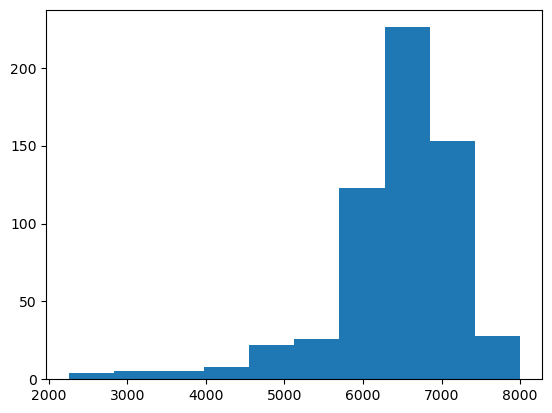

In [3]:
plt.hist(neuromaps_df['cmrglu'])

(array([  6.,   5.,   2.,   6.,  27.,  88., 336., 105.,  17.,   8.]),
 array([1857.9988 , 2374.58552, 2891.17224, 3407.75896, 3924.34568,
        4440.9324 , 4957.51912, 5474.10584, 5990.69256, 6507.27928,
        7023.866  ]),
 <BarContainer object of 10 artists>)

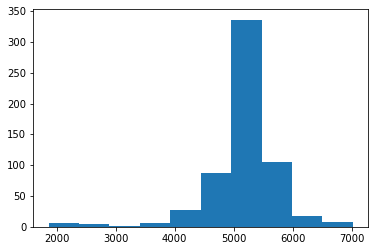

In [9]:
plt.hist(neuromaps_df['cmro2'])

In [10]:
#Find regions with largest glucose/O2 consumption
top_o2_rgns = set(neuromaps_df['region'][np.argsort(-neuromaps_df['cmro2'].values)][:20])
top_o2_rgns

{'Default_pCunPCC_10 R',
 'Default_pCunPCC_15 L',
 'Vis_11 R',
 'Vis_13 L',
 'Vis_14 R',
 'Vis_15 R',
 'Vis_18 R',
 'Vis_19 L',
 'Vis_20 L',
 'Vis_21 R',
 'Vis_22 L',
 'Vis_23 R',
 'Vis_24 R',
 'Vis_26 L',
 'Vis_27 R',
 'Vis_28 L',
 'Vis_31 R',
 'Vis_33 L',
 'Vis_36 R',
 'Vis_37 L'}

In [11]:
#Find regions with smallest glucose/O2 consumption
low_glu_rgns = set(neuromaps_df['region'][np.argsort(neuromaps_df['cmrglu'].values)][:20])
low_glu_rgns

{'Cont_Cing_1 L',
 'Cont_Cing_1 R',
 'Cont_Cing_2 L',
 'Cont_Cing_2 R',
 'Cont_Cing_3 L',
 'Cont_Cing_3 R',
 'Cont_Cing_4 L',
 'Cont_Cing_4 R',
 'Default_PFC_15 L',
 'Default_PFCdPFCm_9 R',
 'Default_pCunPCC_2 L',
 'Default_pCunPCC_2 R',
 'Limbic_TempPole_13 L',
 'Limbic_TempPole_3 R',
 'Limbic_TempPole_5 R',
 'Limbic_TempPole_6 L',
 'Limbic_TempPole_7 R',
 'SalVentAttn_FrOperIns_1 L',
 'SalVentAttn_FrOperIns_1 R',
 'SalVentAttn_Med_1 R'}

In [12]:
#Find regions with smallest glucose/O2 consumption
low_o2_rgns = set(neuromaps_df['region'][np.argsort(neuromaps_df['cmro2'].values)][:20])
low_o2_rgns

{'Cont_Cing_1 L',
 'Cont_Cing_1 R',
 'Cont_Cing_2 L',
 'Cont_Cing_2 R',
 'Cont_Cing_3 L',
 'Cont_Cing_3 R',
 'Cont_Cing_4 L',
 'Cont_Cing_4 R',
 'Default_PFC_15 L',
 'Default_PFCdPFCm_9 R',
 'Default_pCunPCC_2 L',
 'Default_pCunPCC_2 R',
 'Limbic_OFC_7 L',
 'Limbic_TempPole_13 L',
 'Limbic_TempPole_3 L',
 'Limbic_TempPole_5 R',
 'Limbic_TempPole_6 L',
 'Limbic_TempPole_7 L',
 'Limbic_TempPole_7 R',
 'SalVentAttn_Med_1 R'}

In [13]:
low_o2_rgns.difference(low_glu_rgns)

{'Limbic_OFC_7 L', 'Limbic_TempPole_3 L', 'Limbic_TempPole_7 L'}

In [14]:
low_glu_rgns.difference(low_o2_rgns)

{'Limbic_TempPole_3 R',
 'SalVentAttn_FrOperIns_1 L',
 'SalVentAttn_FrOperIns_1 R'}

In [15]:
top_glu_rgns.difference(top_o2_rgns)

{'Cont_PFCl_13 L',
 'Cont_PFCl_19 R',
 'Cont_PFCl_7 R',
 'Cont_PFCl_8 R',
 'Cont_Par_8 L',
 'Cont_pCun_1 L',
 'Cont_pCun_1 R',
 'Default_pCunPCC_10 L',
 'Default_pCunPCC_6 L',
 'Default_pCunPCC_6 R',
 'Default_pCunPCC_9 L'}

In [16]:
top_o2_rgns.difference(top_glu_rgns)

{'Vis_11 R',
 'Vis_13 L',
 'Vis_14 R',
 'Vis_15 R',
 'Vis_19 L',
 'Vis_21 R',
 'Vis_24 R',
 'Vis_26 L',
 'Vis_27 R',
 'Vis_28 L',
 'Vis_36 R'}

## Compare neuromaps with resting-state MEG

Change the block below when looking at different frequency bands/etc! 

In [29]:
#CIRCLE BACK TO THIS
input_dir='C:/Users/vik16/OneDrive/Documents/Baillet Lab/rest_p_rms/'
output_dir=input_dir+'sec/'
meg_rgn_p = pd.read_csv(input_dir+"s600_p_sec_rms_2min_rest_subavg.csv")
#meg_rgn_p=pd.read_csv(input_dir+"s600_p_pri_rms_2min_rest_subavg.csv")
meg_rgn_i = pd.read_csv(input_dir+"s600_i_rms_2min_rest_subavg.csv")
#neuromaps_df is already loaded


In [10]:
meg_rgn_p

,Keys,Values
0,Cont_Cing_1 L,2.847229e-14
1,Cont_Cing_1 R,2.455961e-14
2,Cont_Cing_2 L,2.163366e-14
3,Cont_Cing_2 R,4.239747e-14
4,Cont_Cing_3 L,4.924071e-14
...,...,...
595,Vis_7 R,1.250928e-13
596,Vis_8 L,4.841538e-13
597,Vis_8 R,8.668132e-14
598,Vis_9 L,4.048028e-14


## Load S600 Metabolism Data
from Moohebat Pourmajidian

In [12]:
from scipy import stats
import scipy.stats as ss
s600_met_data = pd.read_pickle('C:/Users/vik16/OneDrive/Documents/Baillet Lab/energy_mean_expression_600.pickle')
s600_meg_met_p_dict = dict()
s600_meg_met_i_dict = dict()
p = meg_rgn_p.loc[:,'Values']
i = meg_rgn_i.loc[:,'Values']
for key in s600_met_data.keys():
    met_data = s600_met_data[key]
    spearman_result = ss.spearmanr(p, met_data)
    r_p = spearman_result[0]
    
    spearman_result = ss.spearmanr(i, met_data)
    r_i = spearman_result[0]
    
    s600_meg_met_p_dict[key] = r_p
    s600_meg_met_i_dict[key] = r_i

In [23]:
s600_meg_met_p_dict
sorted_keys=sorted(s600_meg_met_p_dict, key=lambda dict_key: abs(s600_meg_met_p_dict[dict_key]), reverse=True)
for key in sorted_keys:
    print(key, s600_meg_met_p_dict[key])

gps -0.1530361473226314
betaox -0.11943305398070549
complex2 0.11904449734582595
ppp 0.11563732121478114
creatine 0.09960522112561422
kb_synth -0.08884358012105587
no_signalling -0.0876731879810777
fa_metabolism -0.08169194914430318
ros_gen -0.07582548840413444
gln_glu_cycle 0.07322887008019466
glycogen_cat -0.07266742407617797
kb_util 0.06990152750424306
pdk -0.06925858127383687
atpase 0.06377062158505996
lactate_transport 0.060176722713118636
pc 0.059628832302311946
lactate 0.05058741829838415
tca 0.05008252800702223
ros_detox -0.04854330150917085
complex4 0.04669540748724302
lactate_metabolism 0.038422217839494
pdp 0.03663060175167153
glycogen_synth -0.03396881658004605
glycogen_metabolism -0.030975474931874806
pdc -0.02736779824388401
fa_synth -0.02002222228395079
atpsynth -0.017883216342267617
mas 0.014960597112769756
complex3 -0.010593973872149644
complex1 -0.008456079044664014
etc 0.0032645090680807447
glycolysis 0.0012356700990836084
kb_metabolism 0.00027438965108236407
oxphos 

In [24]:
s600_meg_met_i_dict
sorted_keys=sorted(s600_meg_met_i_dict, key=lambda dict_key: abs(s600_meg_met_i_dict[dict_key]), reverse=True)
for key in sorted_keys:
    print(key, s600_meg_met_i_dict[key])

gps -0.1589066636296212
betaox -0.14731918699774163
ppp 0.1149273747982633
fa_metabolism -0.11444526234795097
kb_synth -0.11120830891196919
no_signalling -0.1073122980897169
creatine 0.09959249886805241
gln_glu_cycle 0.09938083161342115
ros_gen -0.09822243950677641
pdk -0.09292920258111828
ros_detox -0.09040147333742593
complex2 0.08992786091072473
atpsynth -0.07175097708604745
complex1 -0.06299728610357251
complex3 -0.06150933752593756
pdc -0.06124355900988614
glycogen_cat -0.06095911377531603
glycogen_synth -0.0598569440470668
oxphos -0.05593932205367237
etc -0.05263436842880118
lactate_transport 0.05048380689946361
glycogen_metabolism -0.04229739527054241
glycolysis -0.042264506290295246
kb_metabolism -0.03908738635385098
fa_synth -0.03856777379937166
atpase 0.03817399492776369
pc 0.03609304470290195
mas -0.02981613837816216
kb_util 0.02886969130469806
pdp 0.02882869119080886
lactate 0.016664712957535993
complex4 0.002930230361751005
lactate_metabolism 0.002328950913752538
tca 8.922

In [48]:
def append_mean_df(df): #redo with input data that is already an avg./RMS or only generated from a single time point
    df.rename(columns={'Values':'mean'}, inplace=True)
    
def combine_meg_df_with_neuromaps(meg_df, met_column, met_name):
    """
    Goal: take the mean and variance of the MEG time series + join cmrglu/cmro2 by region
    """
    meg_df.rename(columns={'Keys':'region'}, inplace=True)
    #append_mean_var_df(meg_df)
    append_mean_df(meg_df) #in case we only have one time value - see above
    #meg_df=meg_df.merge(neuromaps_df, on='region')
    meg_df.loc[:,met_name]=np.array(met_column)
    return meg_df

combine_meg_df_with_neuromaps(meg_rgn_p, s600_met_data['ppp'], 'ppp')
combine_meg_df_with_neuromaps(meg_rgn_p, s600_met_data['gps'], 'gps')

combine_meg_df_with_neuromaps(meg_rgn_i, s600_met_data['ppp'], 'ppp')
combine_meg_df_with_neuromaps(meg_rgn_i, s600_met_data['gps'], 'gps')

,region,mean,ppp,gps
0,Cont_Cing_1 L,3.719260e-10,0.435069,0.561303
1,Cont_Cing_1 R,2.318640e-10,0.456191,0.484449
2,Cont_Cing_2 L,2.590728e-10,0.415959,0.629770
3,Cont_Cing_2 R,1.912967e-10,0.513376,0.499959
4,Cont_Cing_3 L,3.578323e-10,0.546337,0.479220
...,...,...,...,...
595,Vis_7 R,1.086905e-09,0.505577,0.447684
596,Vis_8 L,2.888836e-09,0.514252,0.413962
597,Vis_8 R,2.777320e-10,0.500201,0.487699
598,Vis_9 L,4.193009e-10,0.513160,0.438471


In [32]:
meg_rgn_p

,Keys,Values
0,Cont_Cing_1 L,2.847229e-14
1,Cont_Cing_1 R,2.455961e-14
2,Cont_Cing_2 L,2.163366e-14
3,Cont_Cing_2 R,4.239747e-14
4,Cont_Cing_3 L,4.924071e-14
...,...,...
595,Vis_7 R,1.250928e-13
596,Vis_8 L,4.841538e-13
597,Vis_8 R,8.668132e-14
598,Vis_9 L,4.048028e-14


## Run network visualizations for GPS shuttle and PPP

In [53]:
#Start with glucose/o2 correlation with mean/var power

name_dict=dict()
name_dict['p']='Power'
name_dict['i']='Current Dipole'
name_dict['gps'] = 'G3P Shuttle'
name_dict['ppp'] = 'Pentose Phosphate Pathway'
name_dict['cmrglu']='CMrGlu'
name_dict['cmro2']='CMrO2'
name_dict['mean']='Mean'
name_dict['var']='Variance'


In [64]:
yeo_sets = [
    
    list(range(0,82)),
    list(range(82, 212)),
    list(range(212, 284)),
    list(range(284, 326)),
    list(range(326, 399)),
    list(range(399, 511)),
    list(range(511, 600))
    
]
# Example row names corresponding to each boxplot
yeo_nets = ['Cont', 'Default', 'DorsAttn', 'Limbic', 'SalVentAttn', 'SomMot', 'Vis']
import scipy.stats as ss
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
from sklearn.preprocessing import scale

def generate_meg_met_figs_yeo(atlas, indices, output_dir, suffix):
    """
    Prerequisites: Merge MEG power/current with neuromaps data into a pd.df called meg_rgn_p/i
    - Have a dictionary of figure words based on input arguments
    
    Inputs: atlas: string (dk, s200, etc.) indicating atlas used for neuromaps/MEG power parcellations
    indices: the subset of parcels that we want to visualize (e.g. a Yeo network)
    - suffix: to add to the title/output filename of each figure (useful for frequency bands/etc.)
    """
    
    # Create a single figure with a 2x2 grid of subplots
    fig, axs = plt.subplots(2, 2, figsize=(12, 10))
    
    # Create a list of meg and met combinations
    meg_list = ['p', 'p', 'i', 'i']  # Each meg type appears twice for 'cmrglu' and 'cmro2'
    met_list = ['gps', 'ppp', 'gps', 'ppp']
    
    for i in range(4):  # Loop through all four plots
        meg = meg_list[i]
        met = met_list[i]
        
        # Calculate regression parameters
        variable_name = f'meg_rgn_{meg}'
        meg_rgn_p_or_i = globals()[variable_name]
        out_str = ''
 
        y = meg_rgn_p_or_i[met][indices]
        y = (y - np.mean(y)) / np.std(y)  # scale
        x = meg_rgn_p_or_i['mean'][indices]
        out_str = 'full'

        slope, intercept, r_value, _, _ = stats.linregress(x, y)
        spearman_result = ss.spearmanr(x, y)
        correlation_coefficient = spearman_result[0]
        p_value = spearman_result[1]

        # Scatter plot
        axs[i // 2, i % 2].scatter(x, y)
        axs[i // 2, i % 2].plot(x, slope * x + intercept, color='red', label='Line of Best Fit')
        
        # Set labels and title with larger font sizes
        axs[i // 2, i % 2].set_ylabel(name_dict[met] + ' (scaled)', fontsize=14)
        axs[i // 2, i % 2].set_xlabel(name_dict['mean'] + ' in ' + name_dict[meg] + ' per region ' + unit_dict[meg + 'mean'], fontsize=14)
        axs[i // 2, i % 2].set_title(suffix + ' Mean ' + name_dict[meg] + ' vs. Mean ' + name_dict[met], fontsize=14)

        # Display the line equation and correlation coefficient on top of the plot with larger font
        textstr = f'Spearman r: {correlation_coefficient:.2f}, p-value: {p_value:.5f}'
        props = dict(boxstyle='round', facecolor='white', alpha=0.5)
        axs[i // 2, i % 2].text(0.05, 0.95, textstr, transform=axs[i // 2, i % 2].transAxes, fontsize=14, verticalalignment='top', bbox=props)

    # Adjust layout
    plt.tight_layout()
    
    # Save the combined figure
    plt.savefig(output_dir + 'combined_' + atlas + '_' + suffix + '.png', transparent=False)
    
    # Show the figure
    plt.show()

    plt.close(fig)  # Close the figure after saving to free memory


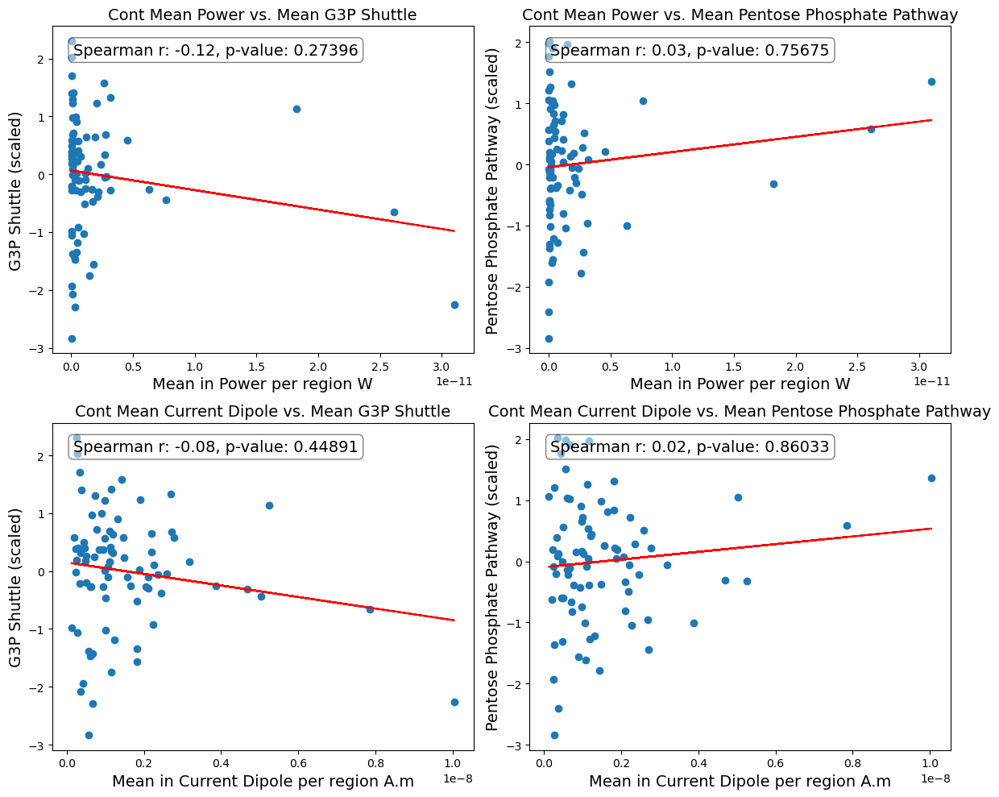

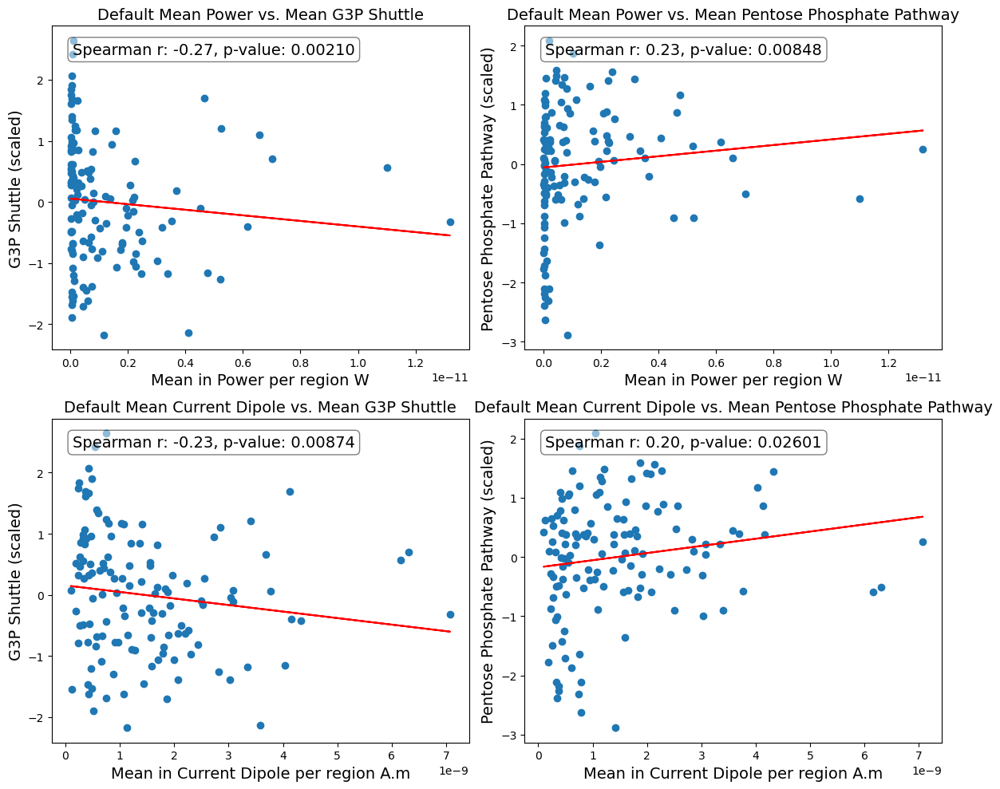

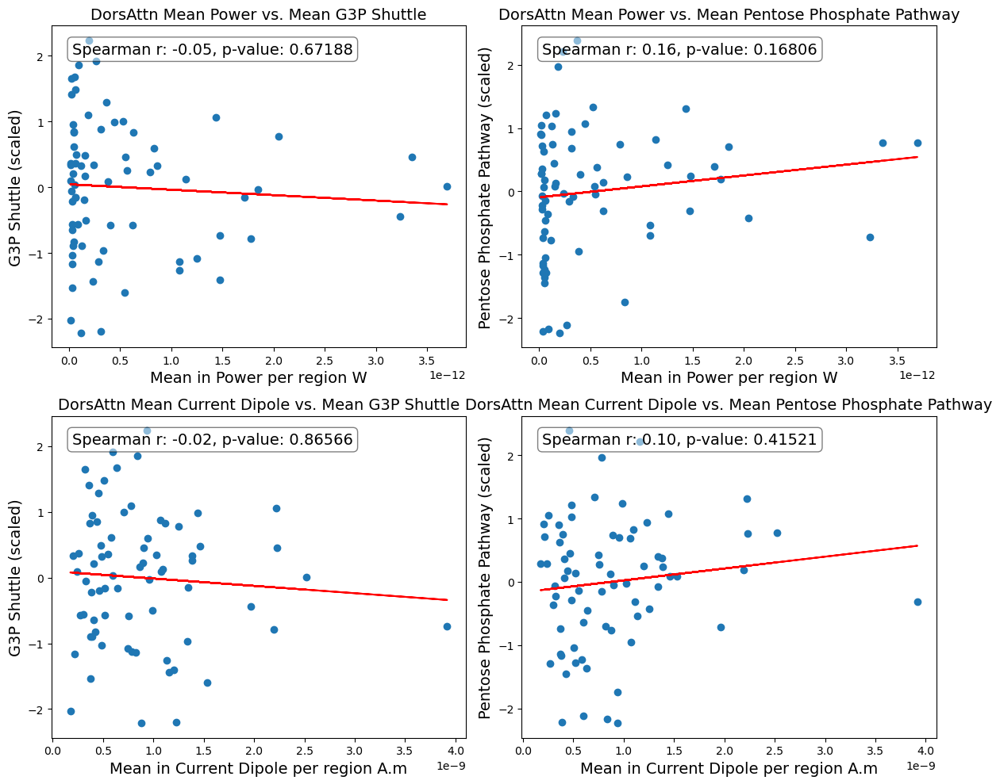

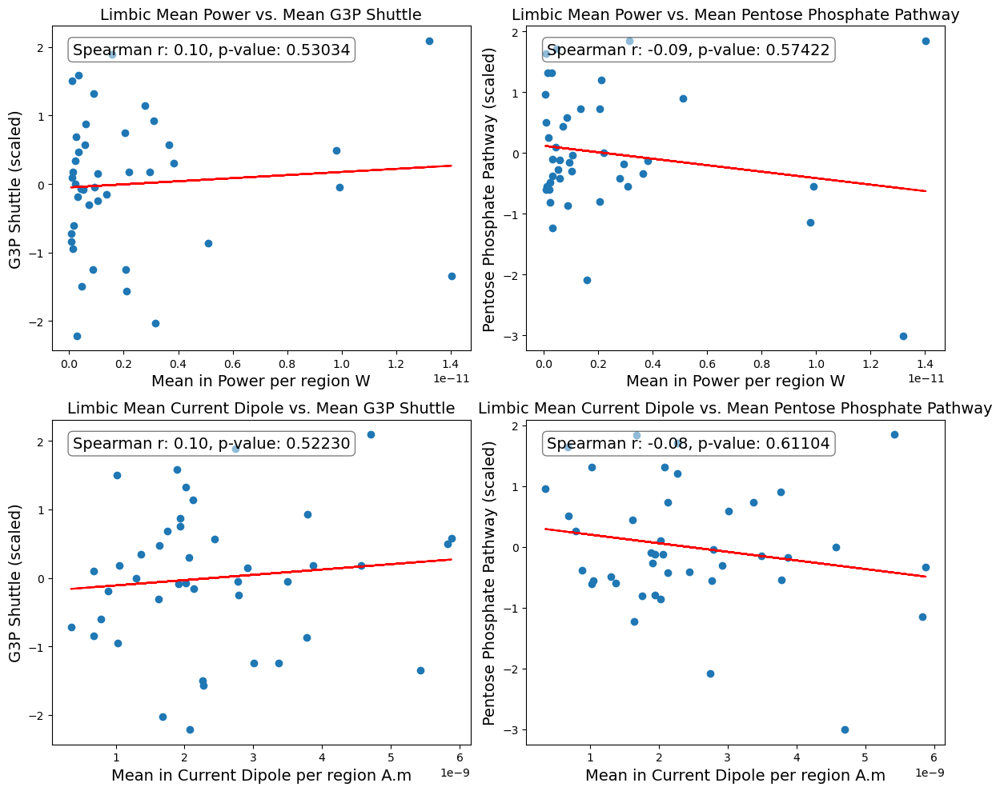

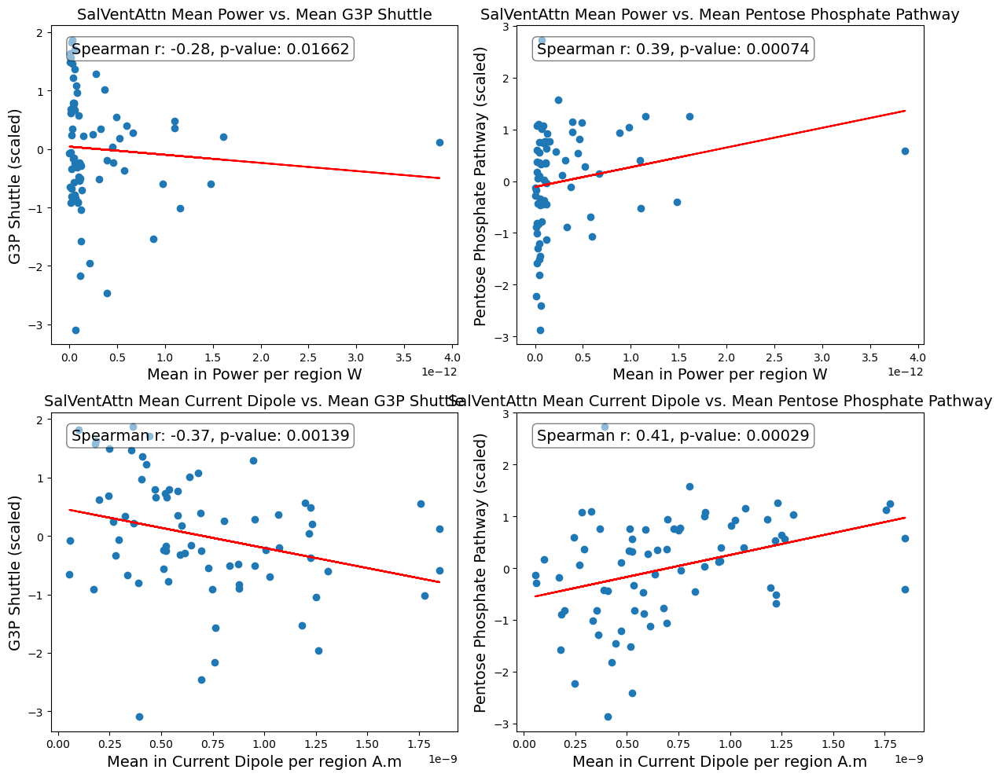

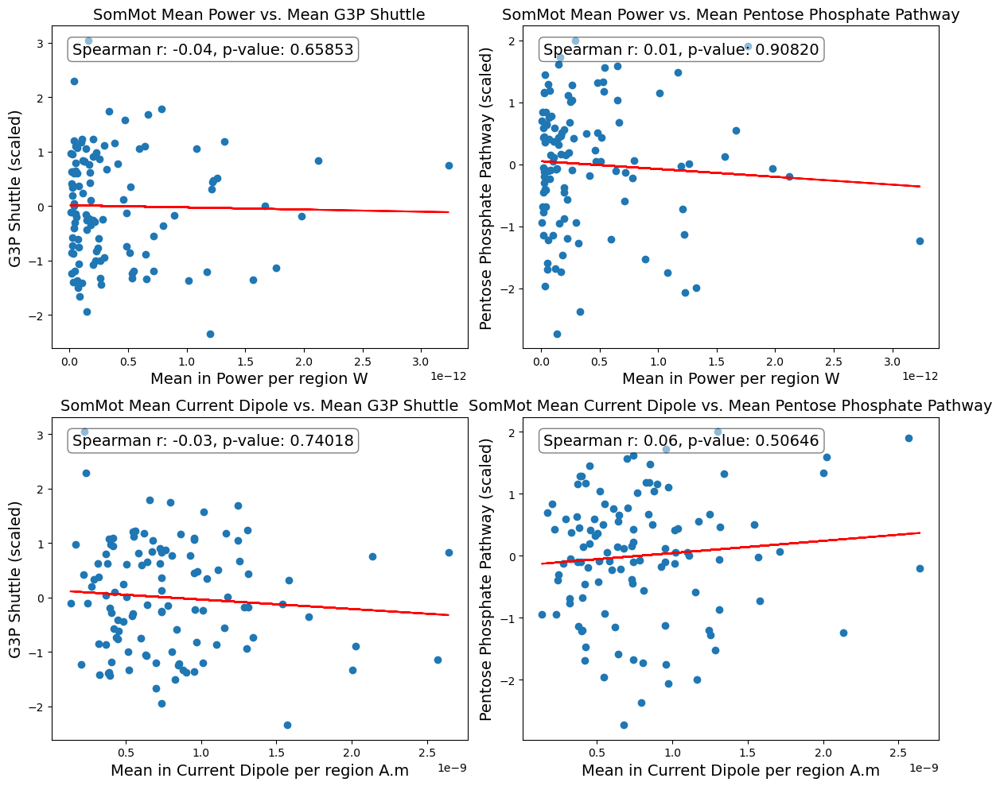

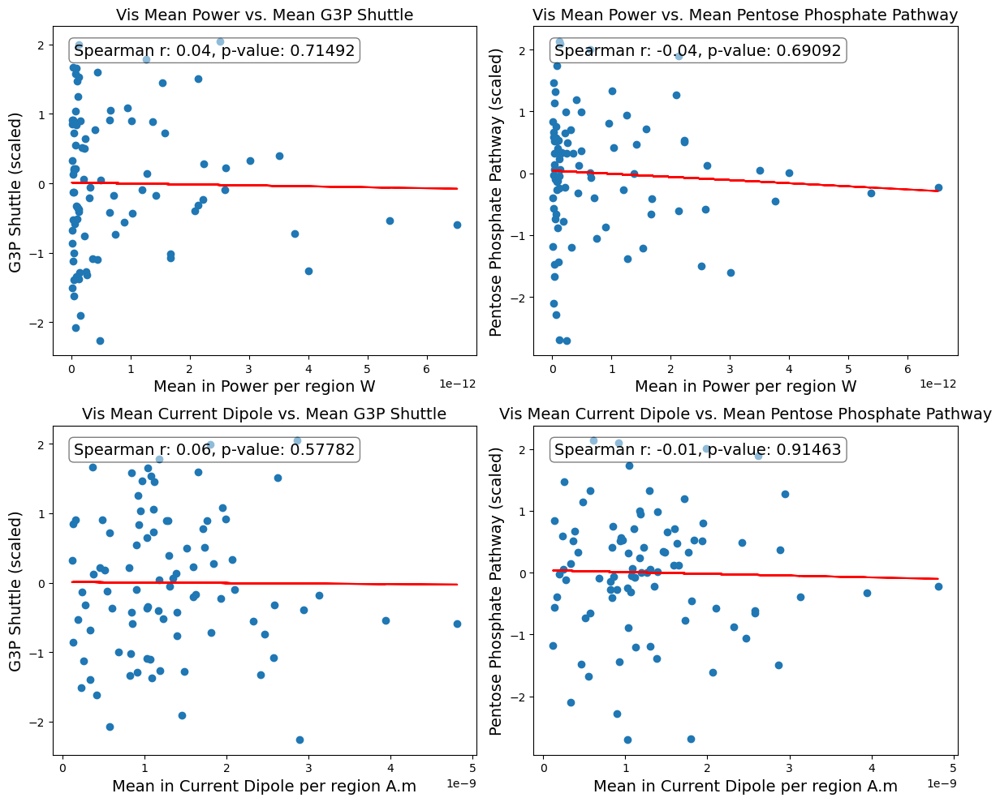

In [65]:
#Find correlations between current/metabolism in each network
output_dir=input_dir+'gene_metabolism/'

for j in range(len(yeo_sets)):
    generate_meg_met_figs_yeo('s600', indices=np.array(yeo_sets[j]), output_dir=output_dir, suffix=yeo_nets[j])

## Continue with full power vs. CMrGlu/CMrO2 analysis

In [5]:
meg_rgn_i2 = pd.read_csv('C:/Users/vik16/OneDrive/Documents/Baillet Lab/rest_p_rms/s600_i_rms_2min_rest_subavg.csv')


In [6]:
meg_rgn_i2

,Keys,Values
0,Cont_Cing_1 L,3.719260e-10
1,Cont_Cing_1 R,2.318640e-10
2,Cont_Cing_2 L,2.590728e-10
3,Cont_Cing_2 R,1.912967e-10
4,Cont_Cing_3 L,3.578323e-10
...,...,...
595,Vis_7 R,1.086905e-09
596,Vis_8 L,2.888836e-09
597,Vis_8 R,2.777320e-10
598,Vis_9 L,4.193009e-10


In [9]:
def append_mean_var_df(df):
    df['mean'] = df.loc[:, 'Values_1':'Values_100'].mean(axis=1)

    # Calculate the variance across columns
    df['var'] = df.loc[:, 'Values_1':'Values_100'].var(axis=1)
    
def append_mean_df(df): #redo with input data that is already an avg./RMS or only generated from a single time point
    df.rename(columns={'Values':'mean'}, inplace=True)
    # Calculate the variance across columns
    #df['var'] = df.loc[:, 'Values_1':'Values_100'].var(axis=1)
    

## Load resting data

In [10]:
def combine_meg_df_with_neuromaps(meg_df):
    """
    Goal: take the mean and variance of the MEG time series + join cmrglu/cmro2 by region
    """
    meg_df.rename(columns={'Keys':'region'}, inplace=True)
    #append_mean_var_df(meg_df)
    append_mean_df(meg_df) #in case we only have one time value - see above
    meg_df=meg_df.merge(neuromaps_df, on='region')
    return meg_df

In [11]:
band_list=['']

meg_rgn_p = combine_meg_df_with_neuromaps(meg_rgn_p)
meg_rgn_i = combine_meg_df_with_neuromaps(meg_rgn_i)


In [19]:
def find_outliers(series, iqr_factor):
    q1 = series.quantile(0.25)
    q3 = series.quantile(0.75)
    iqr = q3 - q1
    lower_bound = q1 - iqr_factor * iqr
    upper_bound = q3 + iqr_factor * iqr
    return series[(series < lower_bound) | (series > upper_bound)]

## Find broadband outliers for power and current dipole.

In [20]:
# Step 2: Find outliers in the 'mean' and 'var' columns
mean_outliers_p = find_outliers(meg_rgn_p['mean'], 3)
mean_out_rm_p_ind = [i for i in range(len(meg_rgn_p['mean'])) if not np.isin(meg_rgn_p['mean'][i], mean_outliers_p)]

#var_outliers_p = find_outliers(meg_rgn_p['var'], 3)
#var_out_rm_p_ind = [i for i in range(len(meg_rgn_p['var'])) if not np.isin(meg_rgn_p['var'][i], var_outliers_p)]

mean_outliers_i = find_outliers(meg_rgn_i['mean'], 3)
mean_out_rm_i_ind = [i for i in range(len(meg_rgn_i['mean'])) if not np.isin(meg_rgn_i['mean'][i], mean_outliers_i)]

#var_outliers_i = find_outliers(meg_rgn_i['var'], 3)
#var_out_rm_i_ind = [i for i in range(len(meg_rgn_i['var'])) if not np.isin(meg_rgn_i['var'][i], var_outliers_i)]

In [21]:
np.corrcoef(meg_rgn_i['mean'], meg_rgn_i_alpha['mean'])[0,1]

NameError: name 'meg_rgn_i_alpha' is not defined

In [19]:
np.corrcoef(meg_rgn_p['mean'], meg_rgn_p_alpha['mean'])[0,1]

0.4429902816403036

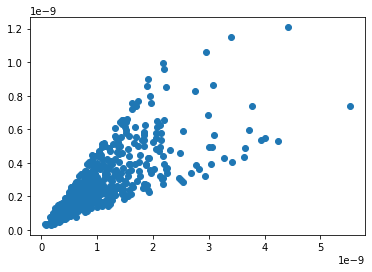

In [20]:
fig, ax = plt.subplots(1, 1)
ax.scatter(meg_rgn_i['mean'], meg_rgn_i_alpha['mean'])

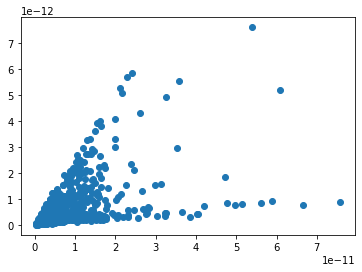

In [21]:
fig, ax = plt.subplots(1, 1)
ax.scatter(meg_rgn_p['mean'], meg_rgn_p_alpha['mean']) #strong outliers

In [25]:
np.corrcoef(meg_rgn_p['mean'], meg_rgn_i_alpha['mean'])[0,1]

0.5442802837942614

In [62]:
meg_rgn_p

,region,mean,cmro2,cmrglu
0,Cont_Cing_1 L,1.576181e-12,2281.0266,3158.1892
1,Cont_Cing_1 R,2.133177e-12,2608.3022,3383.1028
2,Cont_Cing_2 L,1.383791e-12,2444.6470,2814.6045
3,Cont_Cing_2 R,6.627184e-13,2365.3826,3069.7140
4,Cont_Cing_3 L,1.266411e-12,2673.2168,3644.7383
...,...,...,...,...
595,Vis_7 R,5.029031e-12,5623.2670,6543.8360
596,Vis_8 L,2.409923e-11,5940.5825,7223.3820
597,Vis_8 R,2.282258e-12,4600.0010,4958.5670
598,Vis_9 L,1.203988e-12,5337.4760,5921.7344


In [63]:
#Find region with max power/current
meg_rgn_p['region'][np.argsort(-meg_rgn_p['mean'])]

11           Cont_PFCl_1 L
108        Default_PFC_7 L
159       Default_Temp_1 R
36           Cont_PFCl_3 R
286         Limbic_OFC_2 L
              ...         
222     DorsAttn_Post_10 L
463            SomMot_39 L
137        Default_Par_1 L
365    SalVentAttn_Med_4 R
364    SalVentAttn_Med_4 L
Name: region, Length: 600, dtype: object

In [64]:
meg_rgn_i['region'][np.argsort(-meg_rgn_i['mean'])]

11            Cont_PFCl_1 L
36            Cont_PFCl_3 R
108         Default_PFC_7 L
166        Default_Temp_2 R
159        Default_Temp_1 R
               ...         
540                Vis_22 R
355    SalVentAttn_Med_12 L
137         Default_Par_1 L
364     SalVentAttn_Med_4 L
365     SalVentAttn_Med_4 R
Name: region, Length: 600, dtype: object

## Correlate current and power with metabolism.

In [294]:

#var_glu_corr=np.corrcoef(meg_rgn_p['var'], meg_rgn_p['cmrglu'])[0,1]
mean_glu_corr=np.corrcoef(meg_rgn_p['mean'], meg_rgn_p['cmrglu'])[0,1]
#var_glu_corr, mean_glu_corr
mean_glu_corr

-0.06568438144340565

In [295]:
#var_o2_corr=np.corrcoef(meg_rgn_p['var'], meg_rgn_p['cmro2'])[0,1]
mean_o2_corr=np.corrcoef(meg_rgn_p['mean'], meg_rgn_p['cmro2'])[0,1]
#var_o2_corr, mean_o2_corr
mean_o2_corr

-0.12651590144864866

Repeat for currents.

In [296]:
#var_glu_corr=np.corrcoef(meg_rgn_i['var'], meg_rgn_i['cmrglu'])[0,1]
mean_glu_corr=np.corrcoef(meg_rgn_i['mean'], meg_rgn_i['cmrglu'])[0,1]
#var_glu_corr, mean_glu_corr
mean_glu_corr

-0.04811227847457231

In [297]:
#var_o2_corr=np.corrcoef(meg_rgn_i['var'], meg_rgn_i['cmro2'])[0,1]
mean_o2_corr=np.corrcoef(meg_rgn_i['mean'], meg_rgn_i['cmro2'])[0,1]
#var_o2_corr, mean_o2_corr
mean_o2_corr

-0.11041010513625668

### Repeat without outliers.

In [298]:
# Step 2: Find outliers in the 'mean' and 'var' columns
mean_outliers_p = find_outliers(meg_rgn_p['mean'], 3)
mean_out_rm_p_ind = [i for i in range(len(meg_rgn_p['mean'])) if not np.isin(meg_rgn_p['mean'][i], mean_outliers_p)]

#var_outliers_p = find_outliers(meg_rgn_p['var'], 3)
#var_out_rm_p_ind = [i for i in range(len(meg_rgn_p['var'])) if not np.isin(meg_rgn_p['var'][i], var_outliers_p)]


# Step 3: Print the regions with outliers
print("Regions with outliers in 'mean' column:")
mean_out_p_rgns = meg_rgn_p.loc[meg_rgn_p['mean'].isin(mean_outliers_p), 'region'].values
print(mean_out_p_rgns)

#print("\nRegions with outliers in 'var' column:")
#var_out_p_rgns = meg_rgn_p.loc[meg_rgn_p['var'].isin(var_outliers_p), 'region'].values
#print(var_out_p_rgns)

# Step 4: Calculate the correlation after removing outliers
#var_glu_corr = np.corrcoef(meg_rgn_p['var'][var_out_rm_p_ind], meg_rgn_p['cmrglu'][var_out_rm_p_ind])[0, 1]
mean_glu_corr = np.corrcoef(meg_rgn_p['mean'][mean_out_rm_p_ind], meg_rgn_p['cmrglu'][mean_out_rm_p_ind])[0, 1]
mean_glu_corr
#var_glu_corr, mean_glu_corr

Regions with outliers in 'mean' column:
['Cont_OFC_1 L' 'Cont_PFCl_1 L' 'Cont_PFCl_2 R' 'Cont_PFCl_3 R'
 'Cont_PFCl_5 R' 'Cont_Par_2 R' 'Default_PFC_10 L' 'Default_PFC_5 L'
 'Default_PFC_7 L' 'Default_PFCdPFCm_1 R' 'Default_Temp_1 R'
 'Default_Temp_2 R' 'Limbic_OFC_2 L' 'Limbic_OFC_4 L' 'Limbic_OFC_4 R'
 'Limbic_OFC_5 L' 'Limbic_OFC_7 R' 'Limbic_TempPole_1 L'
 'Limbic_TempPole_1 R' 'Limbic_TempPole_2 L' 'Limbic_TempPole_4 L'
 'Limbic_TempPole_9 L' 'SomMot_29 R' 'Vis_15 L']


-0.005595957990634096

In [299]:
#Repeat for currents
# Step 2: Find outliers in the 'mean' and 'var' columns
mean_outliers_i = find_outliers(meg_rgn_i['mean'], 3)
mean_out_rm_i_ind = [i for i in range(len(meg_rgn_i['mean'])) if not np.isin(meg_rgn_i['mean'][i], mean_outliers_i)]

#var_outliers_i = find_outliers(meg_rgn_i['var'], 3)
#var_out_rm_i_ind = [i for i in range(len(meg_rgn_i['var'])) if not np.isin(meg_rgn_i['var'][i], var_outliers_i)]


# Step 3: Print the regions with outliers
print("Regions with outliers in 'mean' column:")
mean_out_i_rgns = meg_rgn_i.loc[meg_rgn_i['mean'].isin(mean_outliers_i), 'region'].values
print(mean_out_i_rgns)

#print("\nRegions with outliers in 'var' column:")
#var_out_i_rgns = meg_rgn_i.loc[meg_rgn_i['var'].isin(var_outliers_i), 'region'].values
#print(var_out_i_rgns)

# Step 4: Calculate the correlation after removing outliers
#var_glu_corr = np.corrcoef(meg_rgn_i['var'][var_out_rm_i_ind], meg_rgn_i['cmrglu'][var_out_rm_i_ind])[0, 1]
mean_glu_corr = np.corrcoef(meg_rgn_i['mean'][mean_out_rm_i_ind], meg_rgn_i['cmrglu'][mean_out_rm_i_ind])[0, 1]

#var_glu_corr, mean_glu_corr
mean_glu_corr

Regions with outliers in 'mean' column:
['Cont_PFCl_1 L' 'Cont_PFCl_2 R' 'Cont_PFCl_3 R' 'Cont_PFCl_5 R'
 'Default_PFC_7 L' 'Default_Temp_1 R' 'Default_Temp_2 R'
 'Limbic_TempPole_1 L' 'Limbic_TempPole_4 L' 'Limbic_TempPole_9 L']


-0.005956128705688166

In [300]:
#Repeat for oxygen
#var_o2_corr = np.corrcoef(meg_rgn_p['var'][var_out_rm_p_ind], meg_rgn_p['cmro2'][var_out_rm_p_ind])[0, 1]
mean_o2_corr = np.corrcoef(meg_rgn_p['mean'][mean_out_rm_p_ind], meg_rgn_p['cmro2'][mean_out_rm_p_ind])[0, 1]
mean_o2_corr
#var_o2_corr, mean_o2_corr

-0.05428631541999471

In [301]:
#Repeat for oxygen, current
#var_o2_corr = np.corrcoef(meg_rgn_i['var'][var_out_rm_i_ind], meg_rgn_i['cmro2'][var_out_rm_i_ind])[0, 1]
mean_o2_corr = np.corrcoef(meg_rgn_i['mean'][mean_out_rm_i_ind], meg_rgn_i['cmro2'][mean_out_rm_i_ind])[0, 1]
mean_o2_corr
#var_o2_corr, mean_o2_corr

-0.06367182773652454

In [302]:
#Find which regions are outliers for power and not current, and vice versa
def find_elements_not_in_second_vector(vector1, vector2):
    
    return [element for element in vector1 if element not in vector2]

print("Outliers for mean current that aren't outliers for mean power:",
      find_elements_not_in_second_vector(mean_out_i_rgns, mean_out_p_rgns))
#print("Outliers for variance in current that aren't outliers for variance in power:", 
#      find_elements_not_in_second_vector(var_out_i_rgns, var_out_p_rgns))

Outliers for mean current that aren't outliers for mean power: []


In [303]:
print("Outliers for mean power that aren't outliers for mean current:",
      find_elements_not_in_second_vector(mean_out_p_rgns, mean_out_i_rgns))
#print("Outliers for variance in power that aren't outliers for variance in current:", 
#      find_elements_not_in_second_vector(var_out_p_rgns, var_out_i_rgns))

Outliers for mean power that aren't outliers for mean current: ['Cont_OFC_1 L', 'Cont_Par_2 R', 'Default_PFC_10 L', 'Default_PFC_5 L', 'Default_PFCdPFCm_1 R', 'Limbic_OFC_2 L', 'Limbic_OFC_4 L', 'Limbic_OFC_4 R', 'Limbic_OFC_5 L', 'Limbic_OFC_7 R', 'Limbic_TempPole_1 R', 'Limbic_TempPole_2 L', 'SomMot_29 R', 'Vis_15 L']


In [304]:
#Output csv
#output_df=pd.concat([meg_rgn_p[['region', 'mean', 'cmro2','cmrglu']], meg_rgn_i[['mean','var']]], axis=1)
output_df=pd.concat([meg_rgn_p[['region', 'mean', 'cmro2','cmrglu']], meg_rgn_i[['mean']]], axis=1)

In [305]:
output_df.columns=['region', 'mean_p', 'cmro2', 'cmrglu','mean_i']

In [306]:
output_df.to_csv(output_dir+'/rms_2min_cent_pri_power_met_broad.csv')

## Visualize current and power correlations with metabolism.

In [52]:
#Create name conversions for figures before plotting
import scipy.stats as stats

unit_dict=dict()
outlier_dict = dict() #contains all non-outlier indices

unit_dict['pmean'] = 'W'
unit_dict['pvar'] = 'W^2'
unit_dict['imean'] = 'A.m'
unit_dict['ivar'] = 'A^2.m^2'

#Update for each set of MEG data/frequency band
outlier_dict['pmean'] = mean_out_rm_p_ind
outlier_dict['imean'] = mean_out_rm_i_ind
#outlier_dict['pvar'] = var_out_rm_p_ind
#outlier_dict['ivar'] = var_out_rm_i_ind


In [59]:
import scipy.stats as ss
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
from sklearn.preprocessing import scale

def generate_meg_met_figs(atlas, indices, outlier_dict, rm_outliers, output_dir, suffix):
    """
    Prerequisites: Merge MEG power/current with neuromaps data into a pd.df called meg_rgn_p/i
    - Have a dictionary of outliers for mean/variance of MEG-derived current/power called outlier_dict
    - Have a dictionary of figure words based on input arguments
    
    Inputs: atlas: string (dk, s200, etc.) indicating atlas used for neuromaps/MEG power parcellations
    indices: the subset of parcels that we want to visualize (e.g. a Yeo network)
    rm_outliers - boolean variable indicating whether to use outlier_dict
    - suffix: to add to the title/output filename of each figure (useful for frequency bands/etc.)
    """
    
    # Create a single figure with a 2x2 grid of subplots
    fig, axs = plt.subplots(2, 2, figsize=(12, 10))
    
    # Create a list of meg and met combinations
    meg_list = ['p', 'p', 'i', 'i']  # Each meg type appears twice for 'cmrglu' and 'cmro2'
    met_list = ['cmrglu', 'cmro2', 'cmrglu', 'cmro2']
    
    for i in range(4):  # Loop through all four plots
        meg = meg_list[i]
        met = met_list[i]
        
        # Calculate regression parameters
        variable_name = f'meg_rgn_{meg}'
        meg_rgn_p_or_i = globals()[variable_name]
        out_str = ''
        if rm_outliers:
            y = scale(meg_rgn_p_or_i[met][outlier_dict[meg + 'mean']])  # scale
            y = (y - np.mean(y)) / np.std(y)  # scale
            x = meg_rgn_p_or_i['mean'][outlier_dict[meg + 'mean']]
            out_str = 'out_filt'
        else:
            y = meg_rgn_p_or_i[met][indices]
            y = (y - np.mean(y)) / np.std(y)  # scale
            x = meg_rgn_p_or_i['mean'][indices]
            out_str = 'full'

        slope, intercept, r_value, _, _ = stats.linregress(x, y)
        spearman_result = ss.spearmanr(x, y)
        correlation_coefficient = spearman_result[0]
        p_value = spearman_result[1]

        # Scatter plot
        axs[i // 2, i % 2].scatter(x, y)
        axs[i // 2, i % 2].plot(x, slope * x + intercept, color='red', label='Line of Best Fit')
        
        # Set labels and title with larger font sizes
        axs[i // 2, i % 2].set_ylabel(name_dict[met] + ' (scaled)', fontsize=18)
        axs[i // 2, i % 2].set_xlabel(name_dict['mean'] + ' in ' + name_dict[meg] + ' per region ' + unit_dict[meg + 'mean'], fontsize=18)
        axs[i // 2, i % 2].set_title(suffix + ' Mean ' + name_dict[meg] + ' vs. Mean ' + name_dict[met], fontsize=16)

        # Display the line equation and correlation coefficient on top of the plot with larger font
        textstr = f'Spearman r: {correlation_coefficient:.2f}, p-value: {p_value:.5f}'
        props = dict(boxstyle='round', facecolor='white', alpha=0.5)
        axs[i // 2, i % 2].text(0.05, 0.95, textstr, transform=axs[i // 2, i % 2].transAxes, fontsize=16, verticalalignment='top', bbox=props)

    # Adjust layout
    plt.tight_layout()
    
    # Save the combined figure
    plt.savefig(output_dir + 'combined_' + atlas + '_' + suffix + '.png', transparent=False)
    
    # Show the figure
    plt.show()

    plt.close(fig)  # Close the figure after saving to free memory


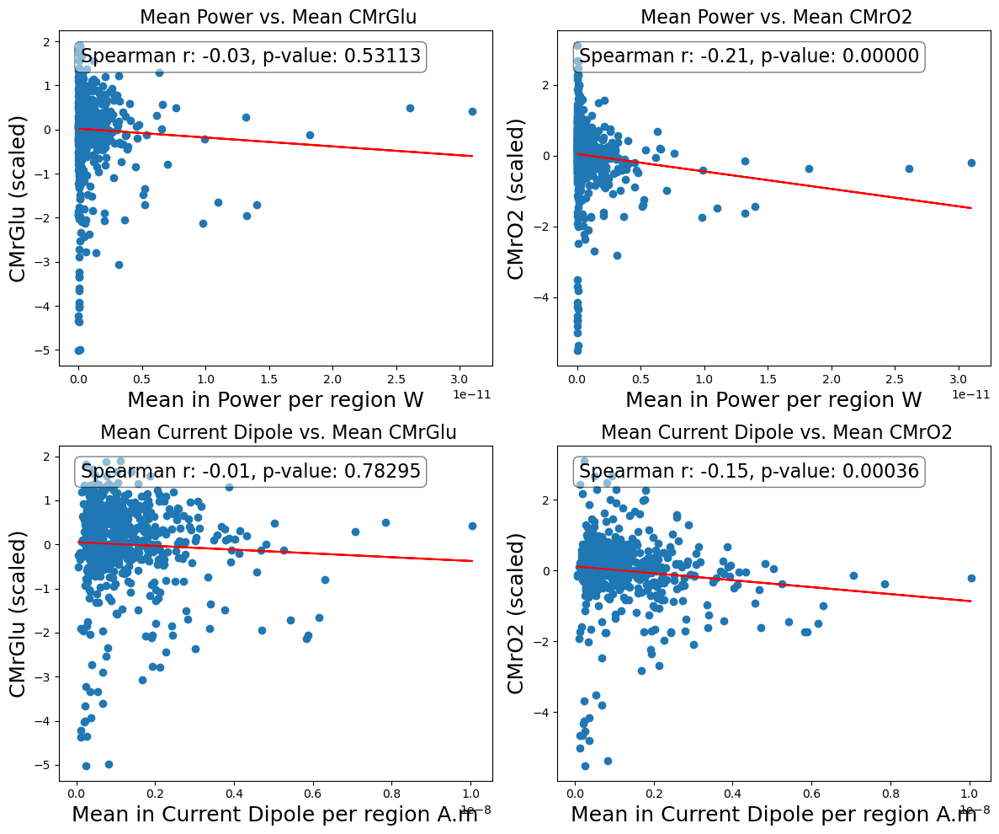

In [76]:
band=''
generate_meg_met_figs('s600', indices=list(range(600)), outlier_dict=outlier_dict,
                          rm_outliers=False, output_dir=output_dir, suffix=band)

## Parcelwise Quadratic Regression

In [346]:
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures


def quadratic_residuals(x, y):
    # Reshape the data to be a column vector
    x = x.reshape(-1, 1)
    y = y.reshape(-1, 1)

    # Apply quadratic transformation to the features
    poly = PolynomialFeatures(degree=2)
    x_poly = poly.fit_transform(x)

    # Fit the quadratic regression model
    model = LinearRegression()
    model.fit(x_poly, y)

    # Predict y values using the model
    y_pred = model.predict(x_poly)

    # Calculate the residuals
    residuals = y - y_pred
    return residuals

#meg_rgn_p = meg_rgn_p_gamma1
#meg_rgn_i = meg_rgn_i_gamma1
resid=quadratic_residuals(np.array(meg_rgn_i['mean']), np.array(meg_rgn_p['mean'])).flatten()
resid_glu_corr = np.corrcoef(resid, meg_rgn_i['cmrglu'])[0, 1]
resid_o2_corr = np.corrcoef(resid, meg_rgn_i['cmro2'])[0, 1]



#Repeat without outliers
resid_no_out=quadratic_residuals(np.array(meg_rgn_i['mean'][mean_out_rm_p_ind]), 
                                 np.array(meg_rgn_p['mean'][mean_out_rm_p_ind])).flatten()
resid_glu_corr_no_out = np.corrcoef(resid_no_out, meg_rgn_i['cmrglu'][mean_out_rm_p_ind])[0, 1]
resid_o2_corr_no_out = np.corrcoef(resid_no_out, meg_rgn_i['cmro2'][mean_out_rm_p_ind])[0, 1]

resid_glu_corr_no_out, resid_o2_corr_no_out

(0.060113426506521496, 0.10524290766781119)

(array([ 53., 141.,   4.,   1.,   0.,   0.,   0.,   0.,   0.,   1.]),
 array([-8.29206534e-10, -1.32168367e-10,  5.64869800e-10,  1.26190797e-09,
         1.95894613e-09,  2.65598430e-09,  3.35302247e-09,  4.05006063e-09,
         4.74709880e-09,  5.44413697e-09,  6.14117513e-09]),
 <BarContainer object of 10 artists>)

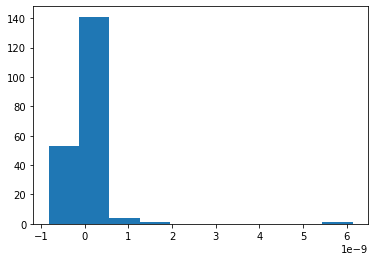

In [339]:
plt.hist(resid)

(array([ 5., 18., 80., 47., 16., 12.,  7.,  5.,  3.,  3.]),
 array([-3.85717426e-10, -2.72781619e-10, -1.59845813e-10, -4.69100060e-11,
         6.60258005e-11,  1.78961607e-10,  2.91897414e-10,  4.04833220e-10,
         5.17769027e-10,  6.30704833e-10,  7.43640640e-10]),
 <BarContainer object of 10 artists>)

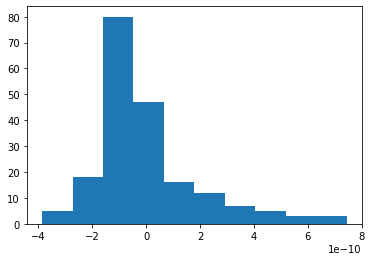

In [340]:
plt.hist(resid_no_out)

In [21]:
resid_glu_corr, resid_o2_corr

(0.08396609292617707, 0.09025608449350994)

## Yeo 7 Network Analyses

In [100]:
meg_rgn_p['region'][500:550]

500    SomMot_55 R
501    SomMot_56 L
502    SomMot_56 R
503     SomMot_6 L
504     SomMot_6 R
505     SomMot_7 L
506     SomMot_7 R
507     SomMot_8 L
508     SomMot_8 R
509     SomMot_9 L
510     SomMot_9 R
511        Vis_1 L
512        Vis_1 R
513       Vis_10 L
514       Vis_10 R
515       Vis_11 L
516       Vis_11 R
517       Vis_12 L
518       Vis_12 R
519       Vis_13 L
520       Vis_13 R
521       Vis_14 L
522       Vis_14 R
523       Vis_15 L
524       Vis_15 R
525       Vis_16 L
526       Vis_16 R
527       Vis_17 L
528       Vis_17 R
529       Vis_18 L
530       Vis_18 R
531       Vis_19 L
532       Vis_19 R
533        Vis_2 L
534        Vis_2 R
535       Vis_20 L
536       Vis_20 R
537       Vis_21 L
538       Vis_21 R
539       Vis_22 L
540       Vis_22 R
541       Vis_23 L
542       Vis_23 R
543       Vis_24 L
544       Vis_24 R
545       Vis_25 L
546       Vis_25 R
547       Vis_26 L
548       Vis_26 R
549       Vis_27 L
Name: region, dtype: object

In [30]:
import numpy as np
import matplotlib.pyplot as plt

def plot_boxplots(input_array, p_or_i, var, row_indices_sets, row_names, suffix):
    """
    Plots seven boxplots based on different sets of integer indices for rows in the input array.

    Parameters:
        input_array (numpy.ndarray): Input array containing data for boxplots.
        row_indices_sets (list of lists): List of lists, where each sublist contains integer indices
                                         for rows corresponding to each boxplot.
        row_names (list): List of row names for which boxplots will be plotted.

    Raises:
        ValueError: If the number of row names is not equal to the number of row_indices_sets.

    Returns:
        None
    """
    plot_name=''
    if len(row_names) != len(row_indices_sets):
        raise ValueError("The number of row names should be equal to the number of row_indices_sets.")

    fig, axs = plt.subplots(1, 1, figsize=(10, 6))

    data_to_plot = [input_array[indices].ravel() for indices in row_indices_sets]
    axs.boxplot(data_to_plot, labels=row_names)
    if p_or_i == "p":
        plot_name='mean_p_yeo_'+suffix+'.png'
        axs.set_title("Mean Power for Yeo 7 Networks")
        axs.set_ylabel("Mean Power (W)")
    else:
        if var == 'var':
            plot_name='var_i_yeo_'+suffix+'.png'
            axs.set_title("Variance in Current for Yeo 7 Networks")
            axs.set_ylabel("Current Variance (A^2)")
        else:   
            plot_name='mean_i_yeo_'+suffix+'.png'
            axs.set_title("Mean Current for Yeo 7 Networks")
            axs.set_ylabel("Mean Current (A.m)")
                      
    axs.set_xlabel("Yeo Network")
    plt.savefig(output_dir+plot_name, transparent=False)

    plt.show()

# Example usage:
# Assuming you have an input array with data and lists of row indices and row names.
# Replace the 'data_array', 'row_indices_sets', and 'row_names' with your actual data.

# Example data with 10 rows and 1000 columns

# Example row indices sets, each containing a list of row indices (in this case, we use random indices)
#this is for s200
#yeo_sets = [
#    list(range(0,31)),
#    list(range(31,76)),
#    list(range(76,102)),
#    list(range(102,114)),
#    list(range(114,136)),
#    list(range(136,171)),
#    list(range(171,200))
#]

yeo_sets = [
    
    list(range(0,82)),
    list(range(82, 212)),
    list(range(212, 284)),
    list(range(284, 326)),
    list(range(326, 399)),
    list(range(399, 511)),
    list(range(511, 600))
    
]
# Example row names corresponding to each boxplot
yeo_nets = ['Cont', 'Default', 'DorsAttn', 'Limbic', 'SalVentAttn', 'SomMot', 'Vis']

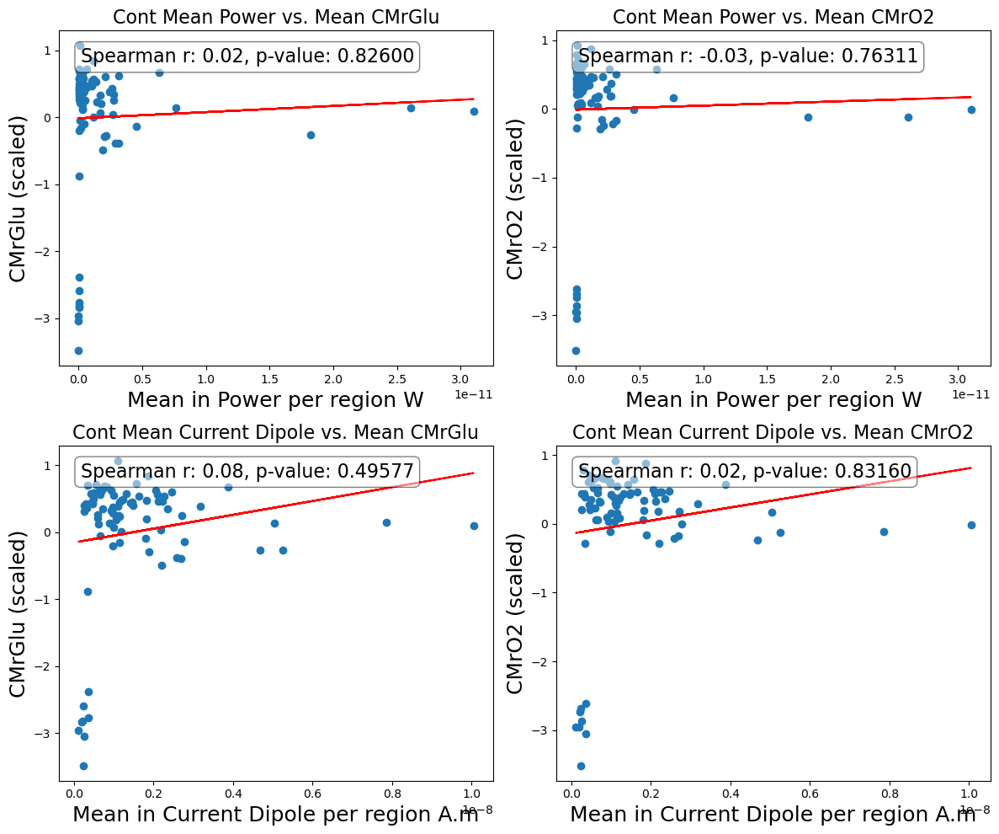

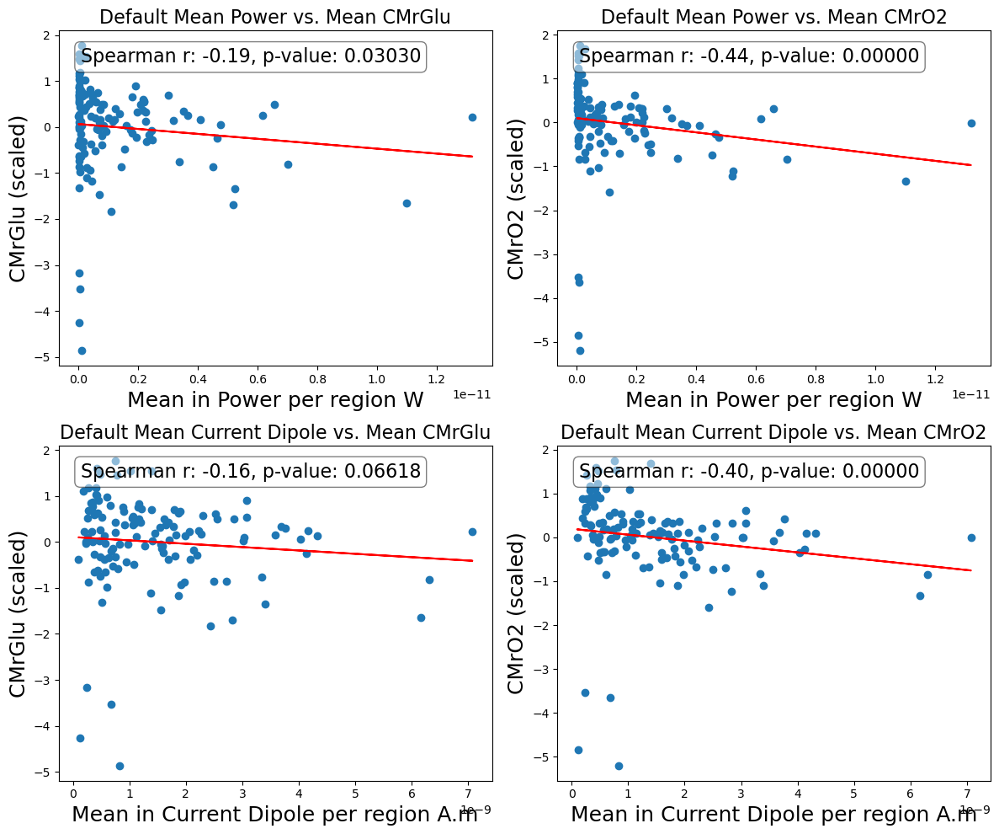

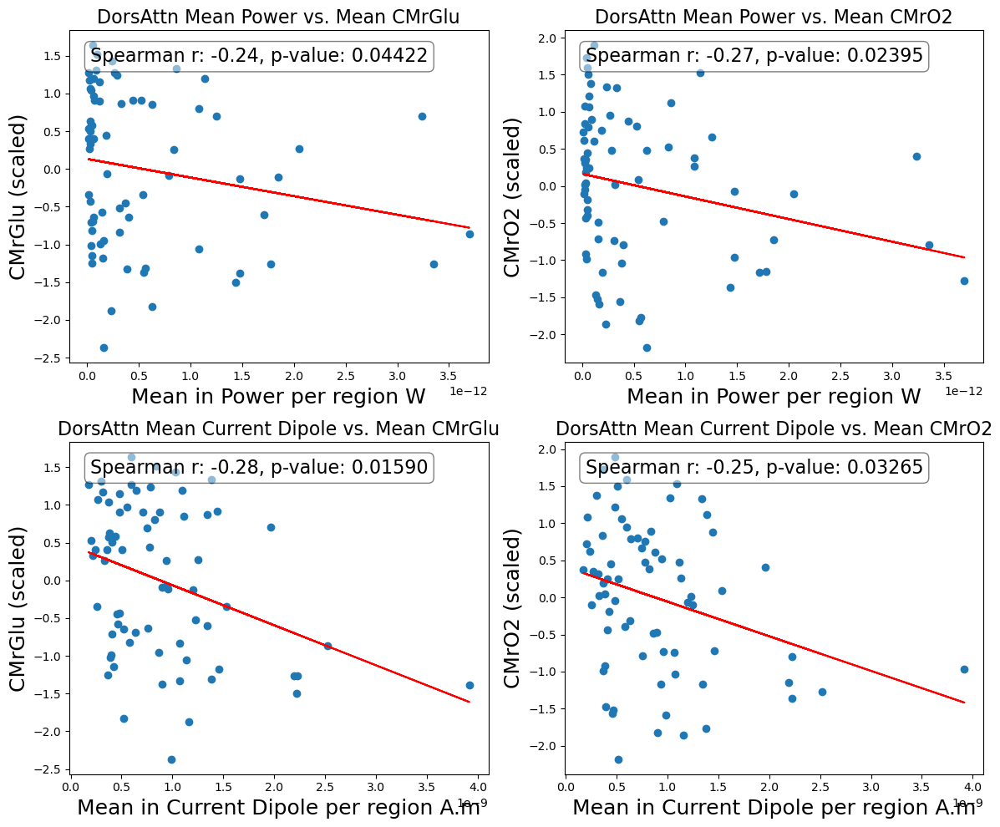

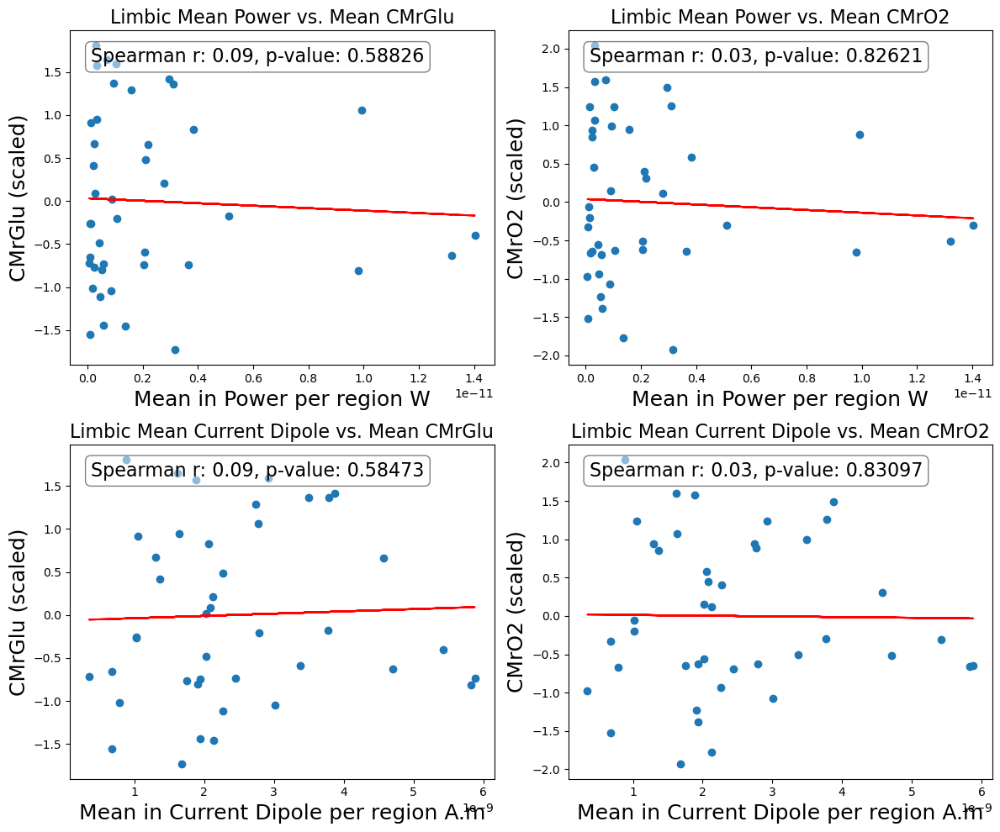

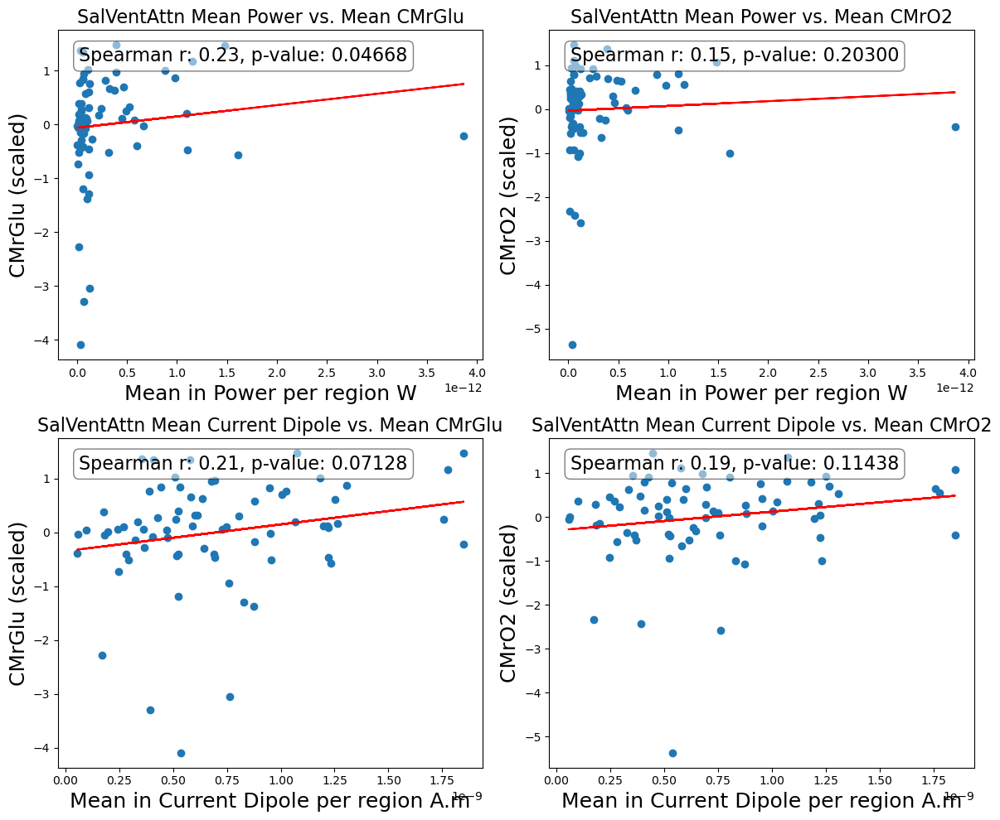

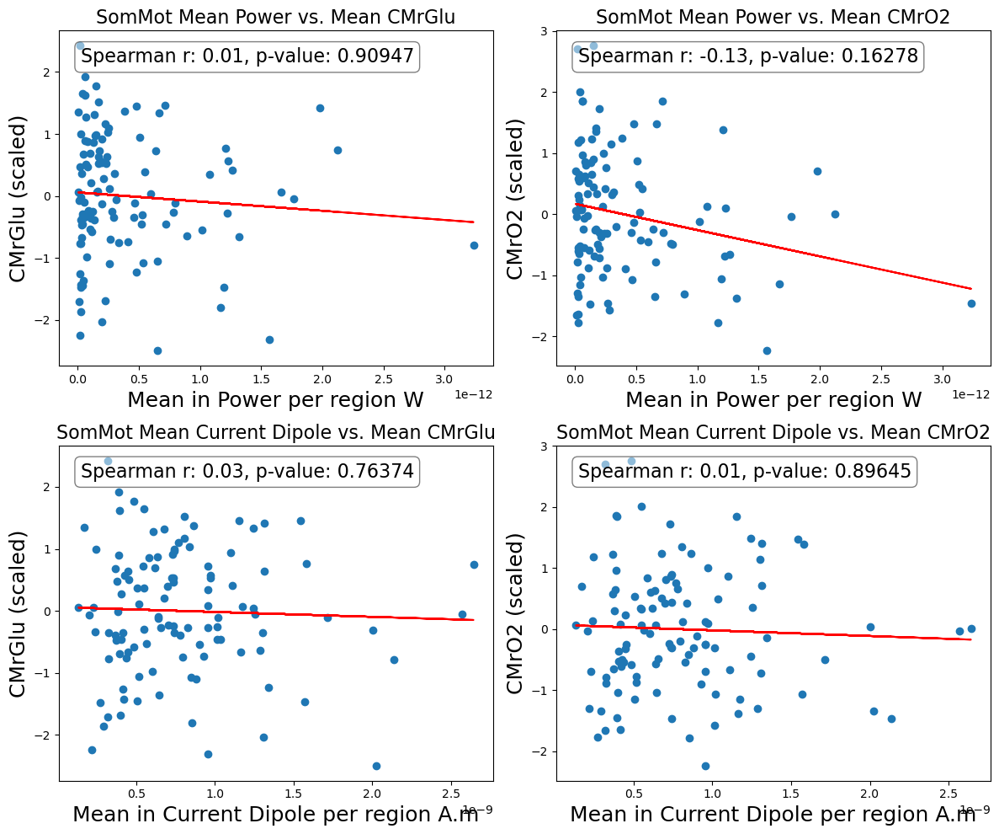

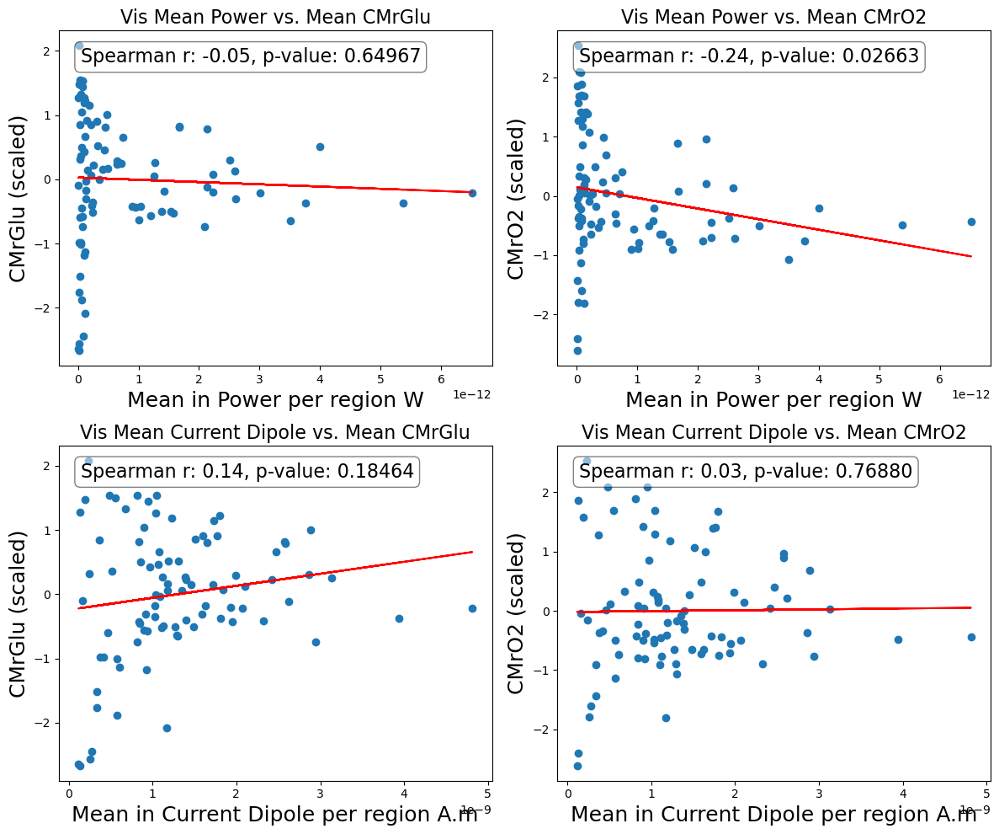

In [77]:
#Find correlations between current/metabolism in each network
for j in range(len(yeo_sets)):
    generate_meg_met_figs('s600', indices=np.array(yeo_sets[j]), outlier_dict=outlier_dict,
                          rm_outliers=False, output_dir=output_dir+'network/', suffix=yeo_nets[j])

Results for frequency band: delta


C:\Users\vik16\AppData\Local\Temp/ipykernel_10788/840714654.py:36: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(1, 1)


Results for frequency band: theta
Results for frequency band: alpha
Results for frequency band: beta
Results for frequency band: gamma1
Results for frequency band: gamma2


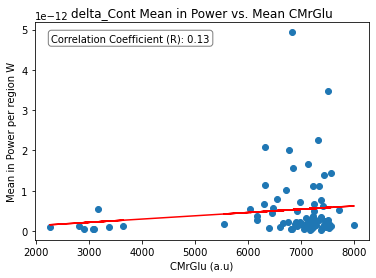

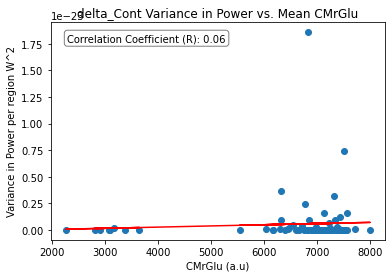

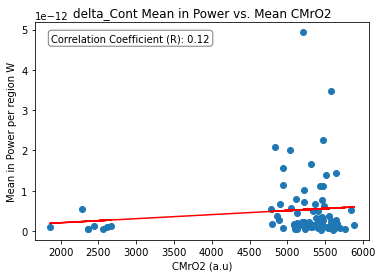

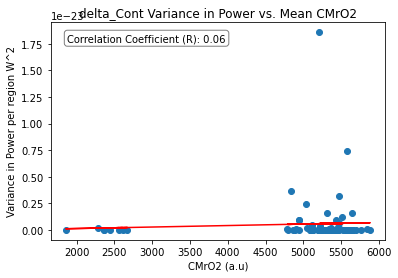

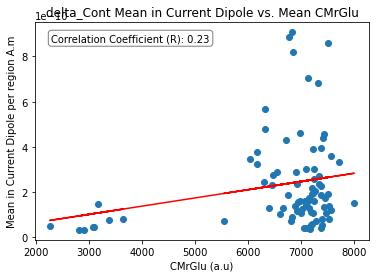

...

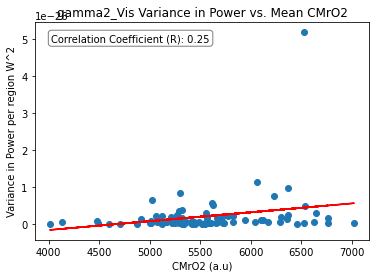

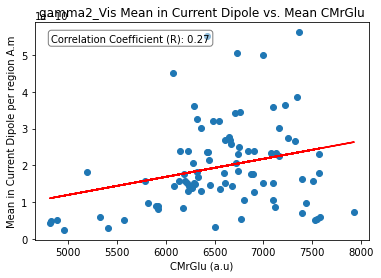

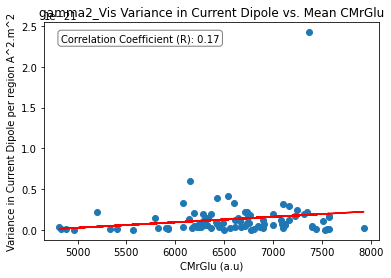

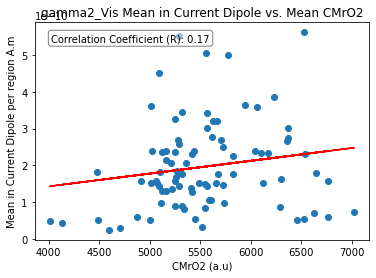

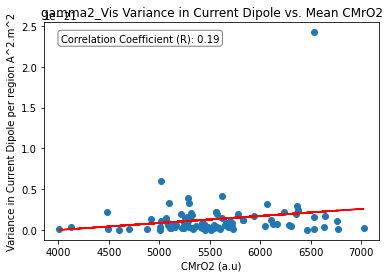

In [55]:
#Repeat for different frequency bands
#Find correlations between current/metabolism in each network
for band in band_list:
    print("Results for frequency band:", band)
    meg_rgn_p = globals()['meg_rgn_p_'+band]
    meg_rgn_i = globals()['meg_rgn_i_'+band]
    for j in range(len(yeo_sets)):
        generate_meg_met_figs('s600', indices=np.array(yeo_sets[j]), outlier_dict=outlier_dict,
                              rm_outliers=False, output_dir=output_dir+'network/bands/', suffix=band+"_"+yeo_nets[j])
        

Results for frequency band: delta


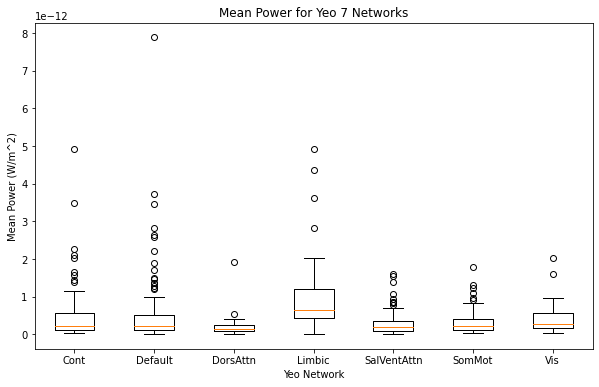

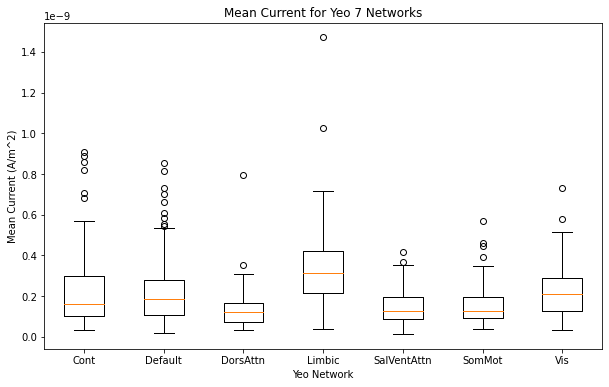

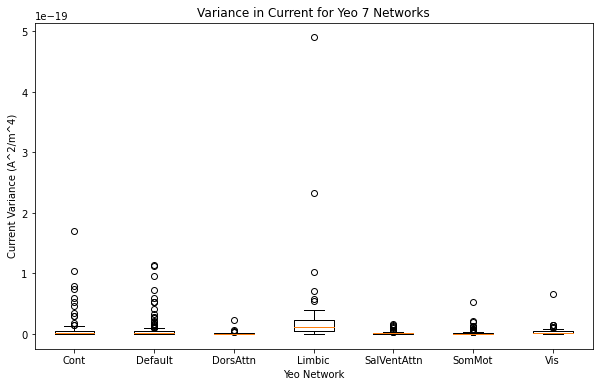

Results for frequency band: theta


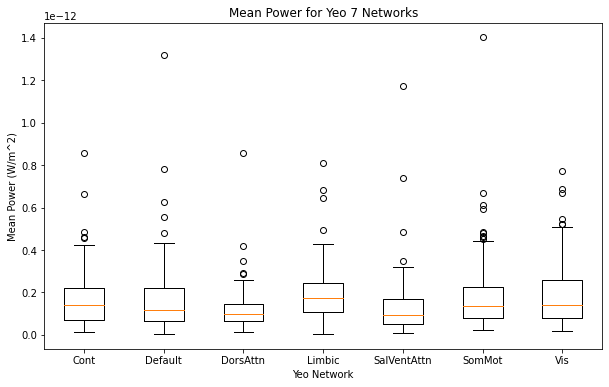

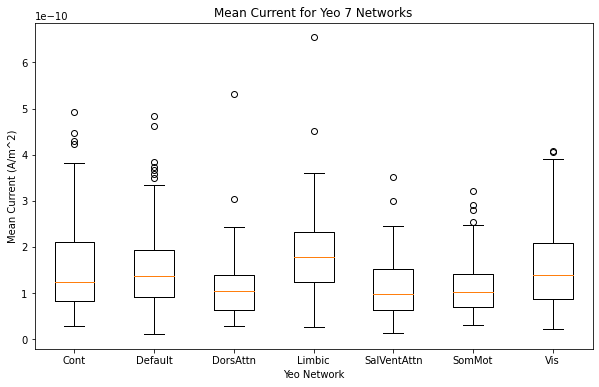

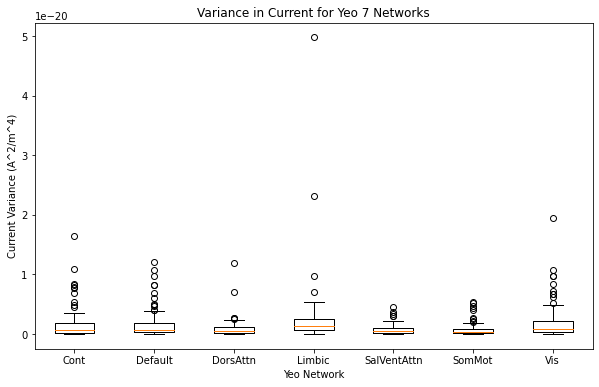

Results for frequency band: alpha


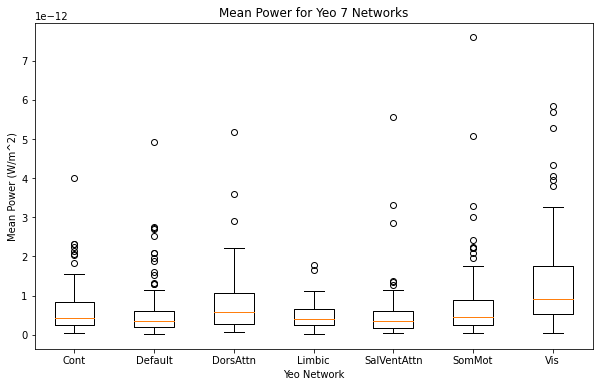

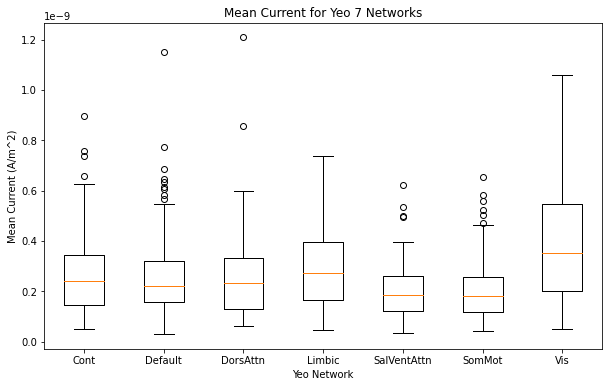

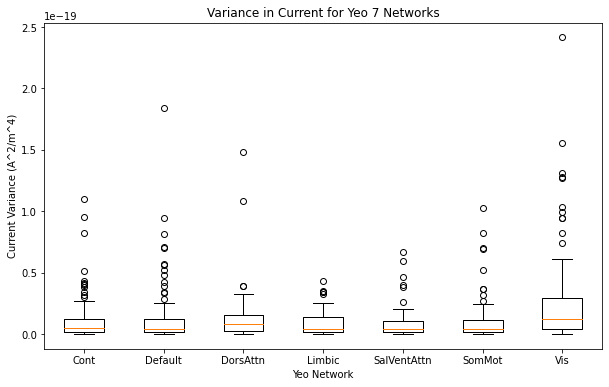

Results for frequency band: beta


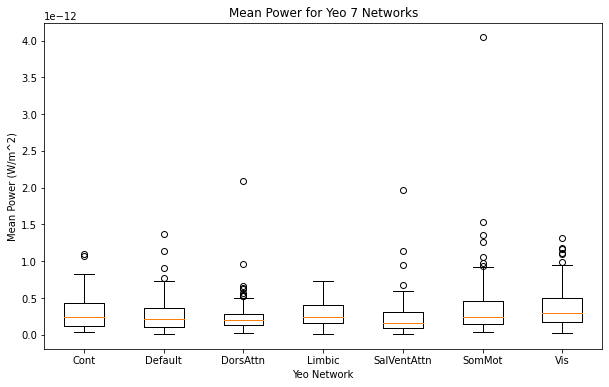

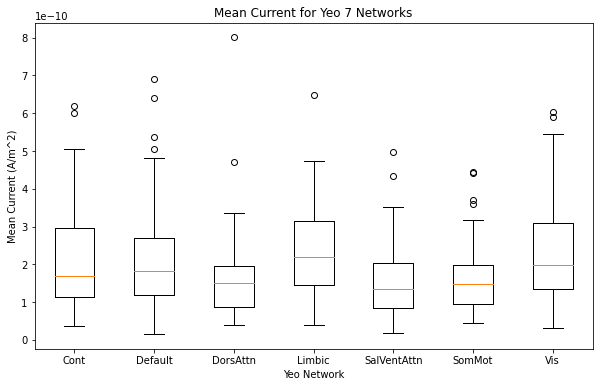

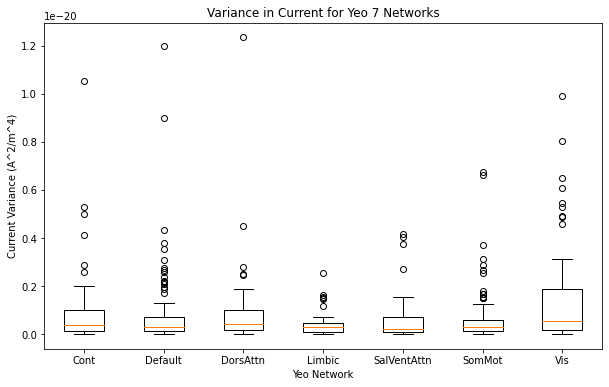

Results for frequency band: gamma1


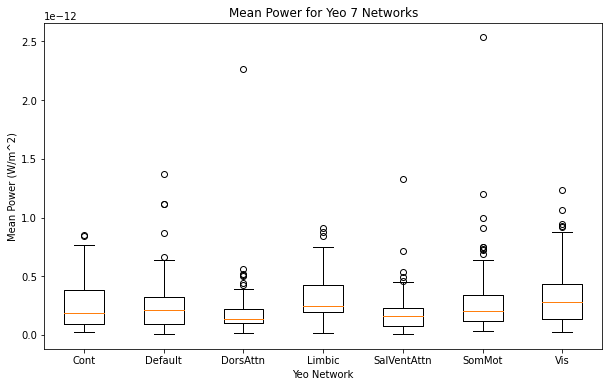

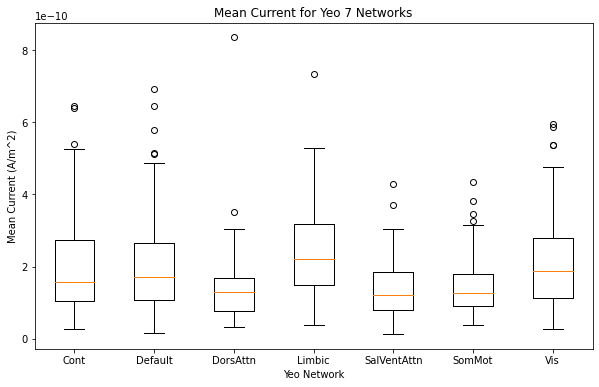

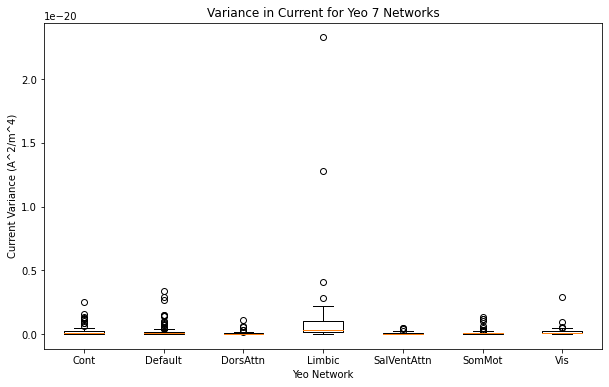

Results for frequency band: gamma2


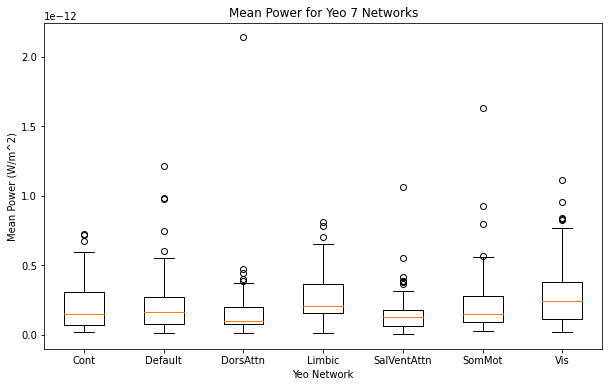

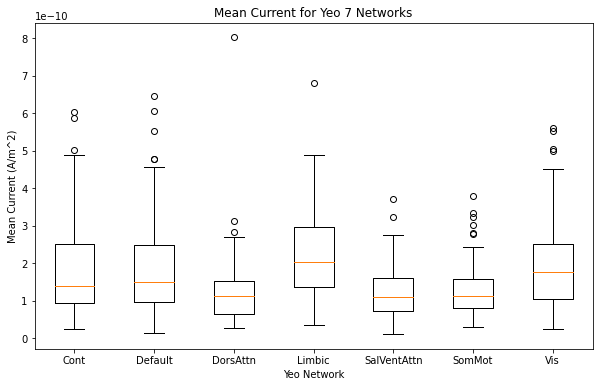

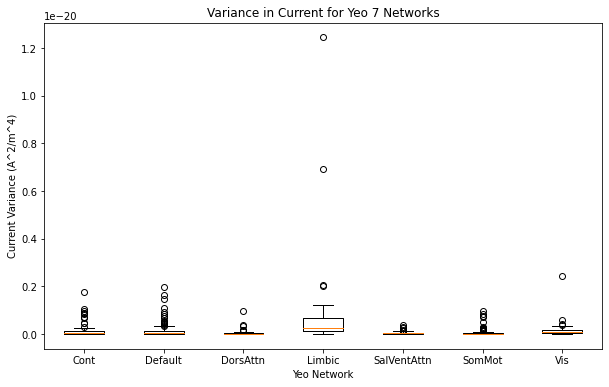

In [56]:
#Repeat for different frequency bands
#Find correlations between current/metabolism in each network
for band in band_list:
    print("Results for frequency band:", band)
    meg_rgn_p = globals()['meg_rgn_p_'+band]
    meg_rgn_i = globals()['meg_rgn_i_'+band]
    plot_boxplots(np.array(meg_rgn_p['mean']), 'p', '', yeo_sets, yeo_nets, band)     
    plot_boxplots(np.array(meg_rgn_i['mean']), 'i', '', yeo_sets, yeo_nets, band)
    plot_boxplots(np.array(meg_rgn_i['var']), 'i', 'var', yeo_sets, yeo_nets, band)

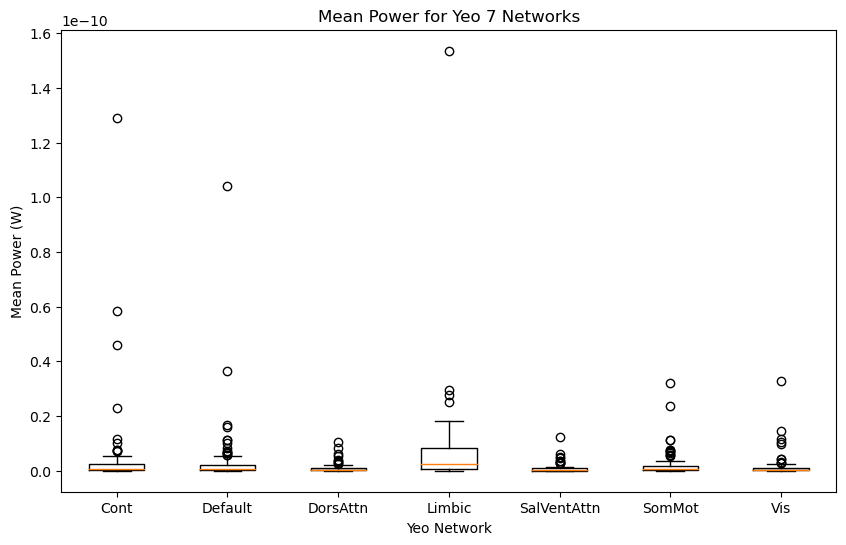

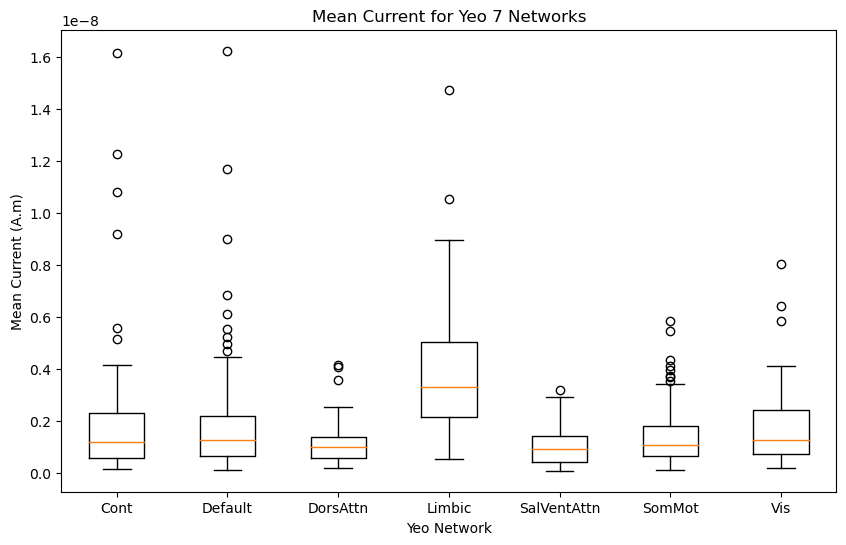

In [250]:
#input_dir='C:/Users/vik16/OneDrive/Documents/Baillet Lab/rest_p_rms/'
#output_dir=input_dir+'sec/'
#meg_rgn_p=combine_meg_df_with_neuromaps(pd.read_csv(input_dir+"s600_p_sec_rms_2min_rest_subavg.csv"))
#meg_rgn_i = combine_meg_df_with_neuromaps(pd.read_csv(input_dir+"s600_i_rms_2min_rest_subavg.csv"))
#meg_rgn_p = combine_meg_df_with_neuromaps(pd.read_csv(input_dir+"s600_p_100s_rest_subavg.csv"))
#meg_rgn_i = combine_meg_df_with_neuromaps(pd.read_csv(input_dir+"s600_i_100s_rest_subavg.csv"))
plot_boxplots(np.array(meg_rgn_p['mean']), 'p', '', yeo_sets, yeo_nets, ' 0s ')     
plot_boxplots(np.array(meg_rgn_i['mean']), 'i', '', yeo_sets, yeo_nets, ' 0s ')
#plot_boxplots(np.array(meg_rgn_i['var']), 'i', 'var', yeo_sets, yeo_nets, '')

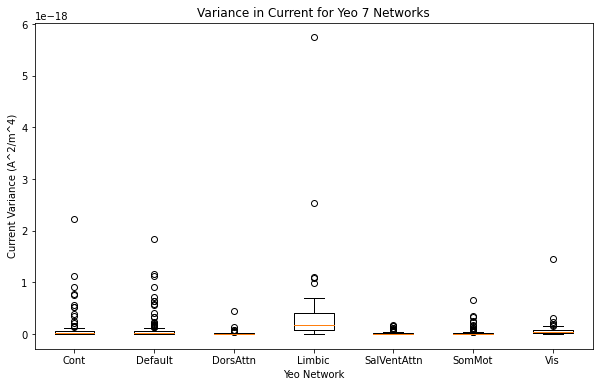

In [58]:
plot_boxplots(np.array(meg_rgn_i['var']), 'i', 'var', yeo_sets, yeo_nets, 'gamma2')

In [147]:
#Find outliers for power/current in each network
num_nets = 7
for i in range(num_nets):
    print("Network:", yeo_nets[i])
    power=meg_rgn_p['mean'][yeo_sets[i]]
    current=meg_rgn_i['mean'][yeo_sets[i]]
    var_current=meg_rgn_i['var'][yeo_sets[i]]
    regions=meg_rgn_p['region'][yeo_sets[i]]
    
    net_out_p = find_outliers(power, 1.5)
    net_out_i = find_outliers(current, 1.5)
    net_out_var_i = find_outliers(var_current, 1.5)
    
    net_out_p_ind = [i for i in yeo_sets[i] if np.isin(power[i], net_out_p)]
    net_out_i_ind = [i for i in yeo_sets[i] if np.isin(current[i], net_out_i)]
    net_out_var_i_ind =  [i for i in yeo_sets[i] if np.isin(var_current[i], net_out_var_i)]

    
    print("Power outliers:", regions[net_out_p_ind].values, net_out_p.values)
    print("Current outliers:", regions[net_out_i_ind].values, net_out_i.values)
    print("Current variance outliers:", regions[net_out_var_i_ind].values, net_out_var_i.values)

    print("********************************")
    print("")

Network: Cont
Power outliers: [] []
Current outliers: [] []
Current variance outliers: [] []
********************************

Network: Default
Power outliers: ['Default_Par_1 R' 'Default_Par_2 L' 'Default_Par_2 R' 'Default_Par_3 R'
 'Default_pCunPCC_2 L' 'Default_pCunPCC_3 L' 'Default_pCunPCC_4 L'] [5.74710007e-09 4.01966090e-09 3.68930110e-09 4.06978620e-09
 3.94698315e-09 8.90355565e-09 6.63989137e-09]
Current outliers: ['Default_Par_1 R' 'Default_Par_3 R' 'Default_pCunPCC_2 L'
 'Default_pCunPCC_3 L' 'Default_pCunPCC_4 L'] [1.54260889e-06 1.26777648e-06 1.19288929e-06 1.54444654e-06
 1.39071020e-06]
Current variance outliers: ['Default_pCunPCC_2 L' 'Default_pCunPCC_3 L' 'Default_pCunPCC_4 L'] [3.28578322e-13 6.49315375e-13 4.69365567e-13]
********************************

Network: DorsAttn
Power outliers: [] []
Current outliers: [] []
Current variance outliers: ['DorsAttn_Post_9 L'] [5.38005009e-13]
********************************

Network: Limbic
Power outliers: ['Limbic_TempPole_

## Repeat for frequency bands.